# **EasyMoney: Haz realidad tus sueños sin complicaciones**

Relaciones principales

Key principal : Todas se unen por pk_cid (cliente) y por pk_partition.
* customer_commercial_activity
* customer_products
* customer_sociodemographics 

Todas se unen por id_producto 
*   sales 
*   product_description 

Union de las dos tablas por pk_cid y pk_partition

## Importacion de librerias 

In [1]:
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, OrdinalEncoder
import pandas as pd  
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns 

from itertools import combinations
from scipy.stats import chi2_contingency
pd.set_option('display.max_columns', None)
import os
os.chdir(r"C:\Users\angel\Desktop\Proyectos_privados\PROYECTOS\EasyMoney_Capstone")
from src.utils import *
from sklearn import set_config
from sklearn.calibration import CalibratedClassifierCV
set_config(transform_output="pandas")
pd.set_option("display.float_format", "{:.4f}".format)
pd.set_option("display.max_columns", None)

target = ["sales_account"]
lista_cod_reg = pd.read_csv("data/raw/codigo_region.csv", sep=";")


## Pasos iniciales de Extración y proceamiento


### 1 Cargar los CSV


In [14]:
cca = pd.read_csv("data/raw/customer_commercial_activity.csv")      # pk_cid, pk_partition
cp  = pd.read_csv("data/raw/customer_products.csv")                 # pk_cid, pk_partition
csd = pd.read_csv("data/raw/customer_sociodemographics.csv")        # pk_cid, pk_partition
sales = pd.read_csv("data/raw/sales.csv")                           # cid
prod_desc = pd.read_csv("data/raw/product_description.csv")         # pk_product_ID

cca = cca.drop('Unnamed: 0', axis=1)
cp = cp.drop('Unnamed: 0', axis=1)
csd = csd.drop('Unnamed: 0', axis=1)
sales = sales.drop('Unnamed: 0', axis=1)
prod_desc = prod_desc.drop('Unnamed: 0', axis=1)


## 2. Proceso de agrupacion y union de las tablas : tabla final (df_v1)

In [176]:
df = cca.merge(cp, on=["pk_cid", "pk_partition"], how="left") \
        .merge(csd, on=["pk_cid", "pk_partition"], how="left")

sales = sales.merge(prod_desc, left_on="product_ID", right_on="pk_product_ID", how="left")
sales_drop = sales.drop('product_ID', axis=1)
eliminar_columnas(sales_drop, ['pk_product_ID', 'pk_sale'])


df_sum = (
    sales_drop.groupby(['cid', 'month_sale'], as_index=False)['net_margin']
      .sum()
      .rename(columns={'net_margin': 'total_net_margin'})
)

df_dummies = pd.get_dummies(sales_drop[['product_desc', 'family_product']], 
                            prefix=['product_desc', 'family_product'])
df_encoded = pd.concat([sales_drop[['cid', 'month_sale']], df_dummies], axis=1)
df_hot = (
    df_encoded
    .groupby(['cid', 'month_sale'], as_index=False)
    .sum()
)

sales_cid = df_sum.merge(df_hot, on=["cid", "month_sale"], how="left")
sales_cid['pk_partition'] = sales_cid['month_sale'].astype('string').str[:7]

sales_cid = sales_cid.rename(columns={"cid": "pk_cid"})
# Drop the 'Unnamed: 0' column from sales before merging to avoid conflicts

df_v1 = df.merge(sales_cid, on=["pk_cid", "pk_partition"], how="left")

In [177]:
df_v1.head(2)

,pk_cid,pk_partition,entry_date,entry_channel,active_customer,segment,short_term_deposit,loans,mortgage,funds,securities,long_term_deposit,em_account_pp,credit_card,payroll,pension_plan,payroll_account,emc_account,debit_card,em_account_p,em_acount,country_id,region_code,gender,age,deceased,salary,month_sale,total_net_margin,product_desc_credit_card,product_desc_debit_card,product_desc_em_acount,product_desc_emc_account,product_desc_funds,product_desc_loans,product_desc_long_term_deposit,product_desc_mortgage,product_desc_payroll,product_desc_payroll_account,product_desc_pension_plan,product_desc_securities,product_desc_short_term_deposit,family_product_account,family_product_investment,family_product_loan,family_product_payment_card,family_product_pension_plan
0,1375586,2018-01,2018-01,KHL,1.0000,02 - PARTICULARES,0,0,0,0,0,0,0,0,0.0000,0.0000,0,0,0,0,1,ES,29.0000,H,35,N,87218.1000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1050611,2018-01,2015-08,KHE,0.0000,03 - UNIVERSITARIO,0,0,0,0,0,0,0,0,0.0000,0.0000,0,0,0,0,1,ES,13.0000,V,23,N,35548.7400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## 2.2 limpiar y definir 

In [178]:
productos_lista = ['product_desc_em_acount' ,'product_desc_emc_account', 'product_desc_payroll', 'product_desc_payroll_account',
                   'product_desc_funds', 'product_desc_long_term_deposit' ,'product_desc_securities' ,'product_desc_short_term_deposit',
                   'product_desc_loans' , 'product_desc_mortgage' ,'product_desc_credit_card','product_desc_debit_card' ,
                   'product_desc_pension_plan']
account	 = ['product_desc_em_acount' ,'product_desc_emc_account', 'product_desc_payroll', 'product_desc_payroll_account']
investment	= ['product_desc_funds', 'product_desc_long_term_deposit' ,'product_desc_securities' ,'product_desc_short_term_deposit']
loan	= ['product_desc_loans' , 'product_desc_mortgage' ]
payment_card=['product_desc_credit_card','product_desc_debit_card' ]
pension_plan = ['product_desc_pension_plan']
familias = ['family_product_account'	,'family_product_investment',	'family_product_loan'	,'family_product_payment_card',	'family_product_pension_plan']

df_v1[account] = (df_v1[account] > 0).astype(int)
df_v1[investment] = (df_v1[investment] > 0).astype(int)
df_v1[loan] = (df_v1[loan] > 0).astype(int)
df_v1[payment_card] = (df_v1[payment_card] > 0).astype(int)
df_v1[pension_plan] = (df_v1[pension_plan] > 0).astype(int)
df_v1[productos_lista] = (df_v1[productos_lista] > 0).astype(int)
df_v1[familias] = (df_v1[familias] > 0).astype(int)

In [179]:
df_v1.head(2)

,pk_cid,pk_partition,entry_date,entry_channel,active_customer,segment,short_term_deposit,loans,mortgage,funds,securities,long_term_deposit,em_account_pp,credit_card,payroll,pension_plan,payroll_account,emc_account,debit_card,em_account_p,em_acount,country_id,region_code,gender,age,deceased,salary,month_sale,total_net_margin,product_desc_credit_card,product_desc_debit_card,product_desc_em_acount,product_desc_emc_account,product_desc_funds,product_desc_loans,product_desc_long_term_deposit,product_desc_mortgage,product_desc_payroll,product_desc_payroll_account,product_desc_pension_plan,product_desc_securities,product_desc_short_term_deposit,family_product_account,family_product_investment,family_product_loan,family_product_payment_card,family_product_pension_plan
0,1375586,2018-01,2018-01,KHL,1.0000,02 - PARTICULARES,0,0,0,0,0,0,0,0,0.0000,0.0000,0,0,0,0,1,ES,29.0000,H,35,N,87218.1000,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1050611,2018-01,2015-08,KHE,0.0000,03 - UNIVERSITARIO,0,0,0,0,0,0,0,0,0.0000,0.0000,0,0,0,0,1,ES,13.0000,V,23,N,35548.7400,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


### - Data en bruto

In [10]:
# df_v1.to_csv("data\processed\output_raw.csv", sep="|", index=False)
# df_v1= pd.read_csv("data\processed\output_raw.csv" , sep  ="|" , low_memory=False)

In [11]:
print(df_v1.shape)
print(df_v1['pk_cid'].nunique())

(5962924, 47)
456373


## 2.3 primeros vistazos del dataset

✔️ Objetivo del análisis : Realizar una analisis de la distribucion de las ventas y la importacia que tiene cada producto

✔️ Tipo de variables : numéricas, categóricas y fecha  de los dataset historico de actividad y ventas realizadas.

In [12]:
df_us = df_v1.copy()

Tabla ventas

In [15]:

sales.head(2)

,pk_sale,cid,month_sale,product_ID,net_margin
0,6666,33620,2018-05-01,2335,952.9000
1,6667,35063,2018-06-01,2335,1625.2000


Tabla final ventas e historico 

In [16]:

df_us.head(2)

,pk_cid,pk_partition,entry_date,entry_channel,active_customer,segment,short_term_deposit,loans,mortgage,funds,securities,long_term_deposit,em_account_pp,credit_card,payroll,pension_plan,payroll_account,emc_account,debit_card,em_account_p,em_acount,country_id,region_code,gender,age,deceased,salary,month_sale,total_net_margin,product_desc_credit_card,product_desc_debit_card,product_desc_em_acount,product_desc_emc_account,product_desc_funds,product_desc_loans,product_desc_long_term_deposit,product_desc_mortgage,product_desc_payroll,product_desc_payroll_account,product_desc_pension_plan,product_desc_securities,product_desc_short_term_deposit,family_product_account,family_product_investment,family_product_loan,family_product_payment_card,family_product_pension_plan
0,1375586,2018-01,2018-01,KHL,1.0000,02 - PARTICULARES,0,0,0,0,0,0,0,0,0.0000,0.0000,0,0,0,0,1,ES,29.0000,H,35,N,87218.1000,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1050611,2018-01,2015-08,KHE,0.0000,03 - UNIVERSITARIO,0,0,0,0,0,0,0,0,0.0000,0.0000,0,0,0,0,1,ES,13.0000,V,23,N,35548.7400,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


##### Entendimiento de las ventas y sus proporciones por productos 

In [184]:
# --- 1. Tabla inicial por familia + producto ---
tabla = (
    sales.groupby(["family_product", "product_desc"])
      .agg(
          clientes_unicos=("cid", "nunique"),
          ganancias_euros=("net_margin", "sum")
      )
      .reset_index()
)

# --- 2. Total general de clientes únicos ---
total_clientes = sales["cid"].nunique()

# --- 3. Clientes únicos por familia ---
clientes_familia = (
    sales.groupby("family_product")["cid"]
      .nunique()
      .reset_index()
      .rename(columns={"cid": "clientes_unicos_familia"})
)

# --- 4. Ganancias totales por familia ---
ganancias_familia = (
    sales.groupby("family_product")["net_margin"]
      .sum()
      .reset_index()
      .rename(columns={"net_margin": "ganancias_totales_familia"})
)

# --- 5. Unimos la info de familia y ganancias ---
tabla = (
    tabla.merge(clientes_familia, on="family_product", how="left")
         .merge(ganancias_familia, on="family_product", how="left")
)

# --- 6. Cálculo de porcentajes sobre el total ---
tabla["pct_clientes_producto_total"] = (
    tabla["clientes_unicos"] / total_clientes * 100
).round(2)

tabla["pct_clientes_familia_total"] = (
    tabla["clientes_unicos_familia"] / total_clientes * 100
).round(2)

# --- 7. Resultado final ---
tabla


,family_product,product_desc,clientes_unicos,ganancias_euros,clientes_unicos_familia,ganancias_totales_familia,pct_clientes_producto_total,pct_clientes_familia_total
0,account,em_acount,117435,8217372.3000,134308,11658524.1000,76.8800,87.9200
1,account,emc_account,12323,862769.3000,134308,11658524.1000,8.0700,87.9200
2,account,payroll,18750,1311247.8000,134308,11658524.1000,12.2700,87.9200
3,account,payroll_account,18110,1267134.7000,134308,11658524.1000,11.8600,87.9200
4,investment,funds,880,1319161.5000,9238,15980873.6000,0.5800,6.0500
5,investment,long_term_deposit,4227,6327477.4000,9238,15980873.6000,2.7700,6.0500
6,investment,securities,1157,1732993.2000,9238,15980873.6000,0.7600,6.0500
7,investment,short_term_deposit,4441,6601241.5000,9238,15980873.6000,2.9100,6.0500
8,loan,loans,25,54598.1000,35,79923.2000,0.0200,0.0200
9,loan,mortgage,10,25325.1000,35,79923.2000,0.0100,0.0200


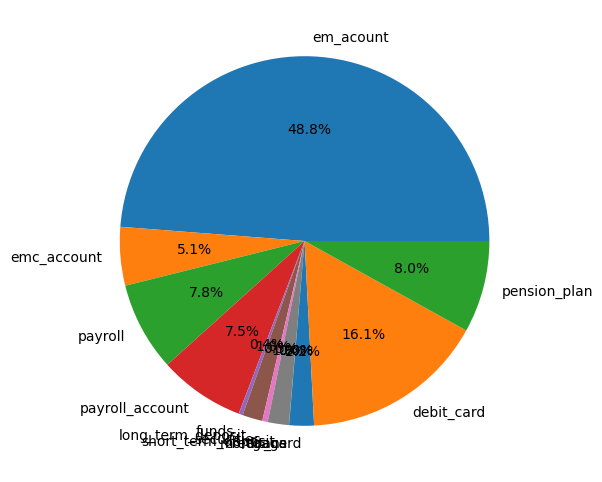

In [185]:
tabla.set_index('product_desc')['clientes_unicos'].plot.pie(
    autopct='%1.1f%%', figsize=(6, 6))
plt.ylabel('')  # Ocultar etiqueta del eje y

plt.show()


Resumen : 
- la mayor cantidad de ventas es por la familia de account con un 48.8% del total de clientes , con esto podemos intentar predecir los clientes que son mas probables a optar por este producto

##### Entendimiento de los registros y sus proporciones por productos y meses

In [186]:

familias = ['family_product_account', 'family_product_investment',
            'family_product_loan', 'family_product_payment_card',	'family_product_pension_plan']

# 1. Número de registros por fecha
tabla = df_us.groupby("pk_partition").agg(
    n_registros=("pk_cid", "count")  # cantidad de registros por fecha
).reset_index()

# 2. Porcentaje por cada columna booleana
for col in familias:
    porcentaje = df_us.groupby("pk_partition")[col].sum() / df_us.groupby("pk_partition")["pk_cid"].count() * 100
    tabla[f"pct_{col}"] = porcentaje.round(3).values

# 3. Fila TOTAL
fila_total = pd.DataFrame({
    "pk_partition": ["TOTAL"],
    "n_registros": [tabla["n_registros"].sum()],
    **{f"pct_{col}": [(df_us[col].sum() / len(df_us) * 100).round(3)] for col in familias}
})

tabla_final = pd.concat([tabla, fila_total], ignore_index=True)

tabla_final


,pk_partition,n_registros,pct_family_product_account,pct_family_product_investment,pct_family_product_loan,pct_family_product_payment_card,pct_family_product_pension_plan
0,2018-01,239493,0.0000,0.0000,0.0000,0.0000,0.0000
1,2018-02,242521,3.0350,0.4250,0.0000,1.7300,0.8270
2,2018-03,245258,2.3260,0.4180,0.0020,1.3130,0.4440
3,2018-04,247463,2.0480,0.3180,0.0020,1.0140,0.4140
4,2018-05,249926,2.0390,0.3280,0.0020,0.8670,0.3710
5,2018-06,252104,2.6380,0.3500,0.0000,0.8850,0.4410
6,2018-07,339339,4.3700,0.2760,0.0010,0.6830,0.4780
7,2018-08,352922,4.5460,0.2450,0.0010,0.6410,0.3110
8,2018-09,375323,5.1040,0.2730,0.0010,0.7410,0.2500
9,2018-10,402300,5.2090,0.2640,0.0000,0.9190,0.3000


Resumen :
- Por cantidad de registros , donde un cliente puede tener varios registros de actividad , podemos ver que los porcentajes de venta por familia son muy pequeños dando el 0.325 % en pensiones.

##### Entendimiento de clientes y sus proporciones por productos y meses

In [187]:
# 1. Número de clientes únicos por fecha
tabla = df_us.groupby("pk_partition").agg(
    unicos=("pk_cid", "nunique")  # cantidad de clientes distintos por fecha
).reset_index()

# 2. Porcentaje por cada columna booleana (sobre clientes únicos)
for col in familias:
    porcentaje = (
        df_us[df_us[col]==1].groupby("pk_partition")["pk_cid"]
        .nunique() / df_us.groupby("pk_partition")["pk_cid"].nunique() * 100
    )
    tabla[f"pct_{col}"] = porcentaje.round(3).values

# 3. Fila TOTAL
fila_total = pd.DataFrame({
    "pk_partition": ["TOTAL"],
    "unicos": [df_us["pk_cid"].nunique()],
    **{f"pct_{col}": [round(df_us[df_us[col]==1]["pk_cid"].nunique() / df_us["pk_cid"].nunique() * 100, 3)] for col in familias}
})

# 4. Concatenar fila TOTAL
tabla_final = pd.concat([tabla, fila_total], ignore_index=True)

tabla_final


,pk_partition,unicos,pct_family_product_account,pct_family_product_investment,pct_family_product_loan,pct_family_product_payment_card,pct_family_product_pension_plan
0,2018-01,239493,NaN,NaN,NaN,NaN,NaN
1,2018-02,242521,3.0350,0.4250,NaN,1.7300,0.8270
2,2018-03,245258,2.3260,0.4180,0.0020,1.3130,0.4440
3,2018-04,247463,2.0480,0.3180,0.0020,1.0140,0.4140
4,2018-05,249926,2.0390,0.3280,0.0020,0.8670,0.3710
5,2018-06,252104,2.6380,0.3500,0.0000,0.8850,0.4410
6,2018-07,339339,4.3700,0.2760,0.0010,0.6830,0.4780
7,2018-08,352922,4.5460,0.2450,0.0010,0.6410,0.3110
8,2018-09,375323,5.1040,0.2730,0.0010,0.7410,0.2500
9,2018-10,402300,5.2090,0.2640,0.0000,0.9190,0.3000


Resumen :
- Por cantidad de clientes unicos por mes ,  podemos ver que los porcentajes de venta por familia son desde los 29.429% en productos acount siendo el mayor porcentaje y el tarjet a predecir

In [17]:
df_us.shape

(5962924, 47)

In [18]:
df_us.head(2)

,pk_cid,pk_partition,entry_date,entry_channel,active_customer,segment,short_term_deposit,loans,mortgage,funds,securities,long_term_deposit,em_account_pp,credit_card,payroll,pension_plan,payroll_account,emc_account,debit_card,em_account_p,em_acount,country_id,region_code,gender,age,deceased,salary,month_sale,total_net_margin,product_desc_credit_card,product_desc_debit_card,product_desc_em_acount,product_desc_emc_account,product_desc_funds,product_desc_loans,product_desc_long_term_deposit,product_desc_mortgage,product_desc_payroll,product_desc_payroll_account,product_desc_pension_plan,product_desc_securities,product_desc_short_term_deposit,family_product_account,family_product_investment,family_product_loan,family_product_payment_card,family_product_pension_plan
0,1375586,2018-01,2018-01,KHL,1.0000,02 - PARTICULARES,0,0,0,0,0,0,0,0,0.0000,0.0000,0,0,0,0,1,ES,29.0000,H,35,N,87218.1000,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1050611,2018-01,2015-08,KHE,0.0000,03 - UNIVERSITARIO,0,0,0,0,0,0,0,0,0.0000,0.0000,0,0,0,0,1,ES,13.0000,V,23,N,35548.7400,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


## 3. Limpieza de datos inicial

In [19]:
# se toma como base que no se le puede vender a clientes menores de edad , ademas porgo el 17 porque contare un es antes de la activdad 
df_us = df_us[ df_us['age']>=17]

In [20]:
df_us.head(2)

,pk_cid,pk_partition,entry_date,entry_channel,active_customer,segment,short_term_deposit,loans,mortgage,funds,securities,long_term_deposit,em_account_pp,credit_card,payroll,pension_plan,payroll_account,emc_account,debit_card,em_account_p,em_acount,country_id,region_code,gender,age,deceased,salary,month_sale,total_net_margin,product_desc_credit_card,product_desc_debit_card,product_desc_em_acount,product_desc_emc_account,product_desc_funds,product_desc_loans,product_desc_long_term_deposit,product_desc_mortgage,product_desc_payroll,product_desc_payroll_account,product_desc_pension_plan,product_desc_securities,product_desc_short_term_deposit,family_product_account,family_product_investment,family_product_loan,family_product_payment_card,family_product_pension_plan
0,1375586,2018-01,2018-01,KHL,1.0000,02 - PARTICULARES,0,0,0,0,0,0,0,0,0.0000,0.0000,0,0,0,0,1,ES,29.0000,H,35,N,87218.1000,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1050611,2018-01,2015-08,KHE,0.0000,03 - UNIVERSITARIO,0,0,0,0,0,0,0,0,0.0000,0.0000,0,0,0,0,1,ES,13.0000,V,23,N,35548.7400,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


## 4. Pre procesamiento de data por clientes unicos

Procedimiento :
Se dividira las ventas en account con las no ventas , en las ventas se tomara el mes anterior a la venta de account y en las no ventas se tomara de forma aleatoria un registro del mes del cliente y de manera proporcional a sus segmetos se reducira al una cantidad del 80% del total 


Considerando un pequeño enriqueismiento de la base de datos aumentando la cantidad de meses activos desde entry , cantidad de meses actuales 

In [21]:
# diff_meses
df_us["entry_date_date"] = pd.to_datetime(df_us["entry_date"], format="%Y-%m")
df_us["pk_partition_date"] = pd.to_datetime(
    df_us["pk_partition"], format="%Y-%m")
df_us["diff_meses"] = (df_us["pk_partition_date"].dt.year - df_us["entry_date_date"].dt.year) * 12 + \
    (df_us["pk_partition_date"].dt.month - df_us["entry_date_date"].dt.month)

df_us["cantidad_de_meses"] = df_us.groupby(
    "pk_cid")["pk_partition_date"].rank(method="first", ascending=True)

# Acumulados de actividad
df_us = df_us.sort_values(
    ["pk_cid", "pk_partition_date"], ascending=[True, True])
df_us["suma_acumulada_active"] = df_us.groupby(
    "pk_cid")["active_customer"].cumsum()


eliminar_columnas(df_us, ['entry_date_date', 'pk_partition_date'])




### - VENTAS DE account

In [22]:
# Clientes con pension plan 
cod_cip_sales_account = df_us[df_us['family_product_account'] > 0]['pk_cid'].unique()

df_con_sales_account = df_us[df_us['pk_cid'].isin(cod_cip_sales_account)]


Carga del mes anterior a la venta :

In [194]:
df_con_sales_account["month"] = pd.to_datetime(
    df_con_sales_account["pk_partition"])

purchase_month = (
    df_con_sales_account[df_con_sales_account["family_product_account"] > 0]
      .loc[:, ["pk_cid", "month"]]
      .rename(columns={"month": "purchase_month"})
)

df_merged = df_con_sales_account.merge(purchase_month, on="pk_cid", how="left")

df_merged["prev_month"] = df_merged["purchase_month"] - pd.DateOffset(months=1)

df_prev_con_sales = df_merged[df_merged["month"] == df_merged["prev_month"]]

eliminar_columnas(df_prev_con_sales, ['month',	'purchase_month',	'prev_month'])

C:\Users\angel\AppData\Local\Temp\ipykernel_9648\2198203793.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_con_sales_account["month"] = pd.to_datetime(
C:\Users\angel\Desktop\Proyectos_privados\PROYECTOS\EasyMoney_Capstone\src\formulas.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return df.drop(columns=columnas, errors='ignore', inplace= True)


In [195]:
# Se seleciona solo las columnas de pk_cid y pk_partition para sobrecargar el proceso
aleatorio = df_prev_con_sales[['pk_cid', 'pk_partition']]

# se eligen de forma aleatoria
df_1mes_aleat = aleatorio.groupby("pk_cid").apply(
    lambda x: x.sample(1)
).reset_index(drop=True)

# Se genera un inner join con la tabla principal para solo tener los aleatorios
df_1mes_con_venta = df_prev_con_sales.merge(
    df_1mes_aleat,
    on=["pk_cid", "pk_partition"],
    how="inner"
)


C:\Users\angel\AppData\Local\Temp\ipykernel_9648\971897.py:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_1mes_aleat = aleatorio.groupby("pk_cid").apply(


In [196]:
# Marcador de venta (target)
df_1mes_con_venta['sales_account'] = 1


In [197]:
df_1mes_con_venta.head(2)


,pk_cid,pk_partition,entry_date,entry_channel,active_customer,segment,short_term_deposit,loans,mortgage,funds,securities,long_term_deposit,em_account_pp,credit_card,payroll,pension_plan,payroll_account,emc_account,debit_card,em_account_p,em_acount,country_id,region_code,gender,age,deceased,salary,month_sale,total_net_margin,product_desc_credit_card,product_desc_debit_card,product_desc_em_acount,product_desc_emc_account,product_desc_funds,product_desc_loans,product_desc_long_term_deposit,product_desc_mortgage,product_desc_payroll,product_desc_payroll_account,product_desc_pension_plan,product_desc_securities,product_desc_short_term_deposit,family_product_account,family_product_investment,family_product_loan,family_product_payment_card,family_product_pension_plan,diff_meses,cantidad_de_meses,suma_acumulada_active,sales_account
0,16203,2018-12,2018-12,KAT,0.0000,NaN,0,0,0,0,0,0,0,0,0.0000,0.0000,0,0,0,0,0,ES,8.0000,V,70,N,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.0000,0.0000,1
1,16502,2018-12,2018-09,KHN,1.0000,02 - PARTICULARES,0,0,0,0,0,0,0,0,0.0000,0.0000,0,0,0,0,1,ES,28.0000,H,58,N,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,4.0000,3.0000,1


In [198]:
print ("Cantidad total de registros de clientes con venta :" ,len(df_1mes_con_venta['pk_cid'].unique()))

Cantidad total de registros de clientes con venta : 52873


### - NO VENTAS DE account

In [199]:
df_sin_sales_account = df_us[~df_us['pk_cid'].isin(cod_cip_sales_account)]

print(df_us.shape)
print(df_sin_sales_account.shape)


(5928962, 50)
(4580733, 50)


Eleccion aleatoria de registro por cliente

In [200]:
# Se seleciona solo las columnas de pk_cid y pk_partition para sobrecargar el proceso 
aleatorio = df_sin_sales_account[['pk_cid', 'pk_partition']]

# se eligen de forma aleatoria
df_1mes_aleat = aleatorio.groupby("pk_cid").apply(
    lambda x: x.sample(1 )
).reset_index(drop=True)

# Se genera un inner join con la tabla principal para solo tener los aleatorios
df_1mes_sin_venta = df_sin_sales_account.merge(
    df_1mes_aleat,
    on=["pk_cid", "pk_partition"],
    how="inner"
)

C:\Users\angel\AppData\Local\Temp\ipykernel_9648\2156794802.py:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_1mes_aleat = aleatorio.groupby("pk_cid").apply(


In [201]:
print("Cantidad inicial sin sample : ", len(df_sin_sales_account))
print("Cantidad de registros aleatorios por cliente : " , len(df_1mes_sin_venta))
print("Cantidad de registros por cliente con venta account: ", len(df_1mes_con_venta))


Cantidad inicial sin sample :  4580733
Cantidad de registros aleatorios por cliente :  319545
Cantidad de registros por cliente con venta account:  52873


In [202]:
df_1mes_sin_venta['sales_account'] = 0

### - Unir ventas con no ventas : 


In [203]:
df_1mes_sin_venta.head(2)


,pk_cid,pk_partition,entry_date,entry_channel,active_customer,segment,short_term_deposit,loans,mortgage,funds,securities,long_term_deposit,em_account_pp,credit_card,payroll,pension_plan,payroll_account,emc_account,debit_card,em_account_p,em_acount,country_id,region_code,gender,age,deceased,salary,month_sale,total_net_margin,product_desc_credit_card,product_desc_debit_card,product_desc_em_acount,product_desc_emc_account,product_desc_funds,product_desc_loans,product_desc_long_term_deposit,product_desc_mortgage,product_desc_payroll,product_desc_payroll_account,product_desc_pension_plan,product_desc_securities,product_desc_short_term_deposit,family_product_account,family_product_investment,family_product_loan,family_product_payment_card,family_product_pension_plan,diff_meses,cantidad_de_meses,suma_acumulada_active,sales_account
0,16063,2019-01,2018-11,KAT,1.0000,02 - PARTICULARES,0,0,0,0,0,0,0,0,0.0000,0.0000,0,0,0,0,0,ES,28.0000,H,62,N,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,3.0000,3.0000,0
1,17457,2019-02,2017-09,KAT,1.0000,02 - PARTICULARES,0,0,0,0,0,1,0,0,0.0000,0.0000,0,0,0,0,1,ES,28.0000,H,53,N,102405.7500,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,17,14.0000,14.0000,0


In [204]:
df_1mes_con_venta.head(2)


,pk_cid,pk_partition,entry_date,entry_channel,active_customer,segment,short_term_deposit,loans,mortgage,funds,securities,long_term_deposit,em_account_pp,credit_card,payroll,pension_plan,payroll_account,emc_account,debit_card,em_account_p,em_acount,country_id,region_code,gender,age,deceased,salary,month_sale,total_net_margin,product_desc_credit_card,product_desc_debit_card,product_desc_em_acount,product_desc_emc_account,product_desc_funds,product_desc_loans,product_desc_long_term_deposit,product_desc_mortgage,product_desc_payroll,product_desc_payroll_account,product_desc_pension_plan,product_desc_securities,product_desc_short_term_deposit,family_product_account,family_product_investment,family_product_loan,family_product_payment_card,family_product_pension_plan,diff_meses,cantidad_de_meses,suma_acumulada_active,sales_account
0,16203,2018-12,2018-12,KAT,0.0000,NaN,0,0,0,0,0,0,0,0,0.0000,0.0000,0,0,0,0,0,ES,8.0000,V,70,N,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.0000,0.0000,1
1,16502,2018-12,2018-09,KHN,1.0000,02 - PARTICULARES,0,0,0,0,0,0,0,0,0.0000,0.0000,0,0,0,0,1,ES,28.0000,H,58,N,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,4.0000,3.0000,1


In [205]:
# Unir y mezclar
df_final = pd.concat([df_1mes_sin_venta, df_1mes_con_venta])

print(df_final['sales_account'].value_counts())


sales_account
0    319545
1     52873
Name: count, dtype: int64


Evaluacion del balanceo actual de 13.84 % de ventas de account

In [206]:
df_final.pivot_table(index=['pk_partition'], values='sales_account', aggfunc=[len, sum, np.mean])

C:\Users\angel\AppData\Local\Temp\ipykernel_9648\827467380.py:1: FutureWarning: The provided callable <built-in function sum> is currently using DataFrameGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  df_final.pivot_table(index=['pk_partition'], values='sales_account', aggfunc=[len, sum, np.mean])
C:\Users\angel\AppData\Local\Temp\ipykernel_9648\827467380.py:1: FutureWarning: The provided callable <function mean at 0x000002903E4E3740> is currently using DataFrameGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  df_final.pivot_table(index=['pk_partition'], values='sales_account', aggfunc=[len, sum, np.mean])


,len,sum,mean
,sales_account,sales_account,sales_account
pk_partition,,,
2018-01,16470,3571,0.2168
2018-02,15056,2150,0.1428
2018-03,14647,1890,0.1290
2018-04,14801,1872,0.1265
2018-05,16035,3311,0.2065
2018-06,14799,2009,0.1358
2018-07,24271,4722,0.1946
2018-08,22252,2876,0.1292


In [207]:
# df_final.to_csv("data/processed/output_procesado.csv", sep="|", index=False)

In [5]:
df_final.head(2)

,pk_cid,pk_partition,entry_date,entry_channel,active_customer,segment,short_term_deposit,loans,mortgage,funds,securities,long_term_deposit,em_account_pp,credit_card,payroll,pension_plan,payroll_account,emc_account,debit_card,em_account_p,em_acount,country_id,region_code,gender,age,deceased,salary,month_sale,total_net_margin,product_desc_credit_card,product_desc_debit_card,product_desc_em_acount,product_desc_emc_account,product_desc_funds,product_desc_loans,product_desc_long_term_deposit,product_desc_mortgage,product_desc_payroll,product_desc_payroll_account,product_desc_pension_plan,product_desc_securities,product_desc_short_term_deposit,family_product_account,family_product_investment,family_product_loan,family_product_payment_card,family_product_pension_plan,sales_account
0,1050625,2018-01,2015-08,KHE,1.0000,03 - UNIVERSITARIO,0,0,0,0,0,0,0,0,0.0000,0.0000,0,0,0,0,1,ES,49.0000,V,23,N,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1050605,2018-01,2015-08,KHE,0.0000,03 - UNIVERSITARIO,0,0,0,0,0,0,0,0,0.0000,0.0000,0,0,0,0,1,ES,45.0000,V,23,N,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


# INPUT: EDA + Data Cleaning

In [3]:
# df_final = pd.read_csv("data/processed/output_procesado.csv", sep="|", low_memory=False)

## 🔹 1. Comprender el problema y los datos

✔️ Objetivo del análisis : Realizar una prospeción de probablidad de compra de uno o varios productos.

✔️ Tipo de variables : numéricas, categóricas y fecha  de los dataset historico de actividad y ventas realizadas.

Resumen : La cantidad de informacion por historico indica las actividades que realizo un cliente sin embargo infla mucho el numero de registros debido a las fechas , al realizar un analisis por cid unico , podemos ver que la base aun se encuentra desbalanceada , el problema es que para generar una venta se necesita saber que atributos son los de mayor importancia para que se realice de forma ejectiva pero la base esta desbalanceada para los productos que mayor ganacia generan como "pension plan" e "investment".

Con esto como objetivo se intentara predecir la venta de un produto de pension plan , que es el que mayor  ganacia da y con una 4.24% de la base total de clientes 

Se realizo un Undersample teniendo en cuenta que para cada cliente se eligira de manera aleatora uno de sus registros y para los clientes que compraron alguna vez el producto pension se tomara en cuenta el mes anterior a su compra

In [208]:
df_final.head(2)

,pk_cid,pk_partition,entry_date,entry_channel,active_customer,segment,short_term_deposit,loans,mortgage,funds,securities,long_term_deposit,em_account_pp,credit_card,payroll,pension_plan,payroll_account,emc_account,debit_card,em_account_p,em_acount,country_id,region_code,gender,age,deceased,salary,month_sale,total_net_margin,product_desc_credit_card,product_desc_debit_card,product_desc_em_acount,product_desc_emc_account,product_desc_funds,product_desc_loans,product_desc_long_term_deposit,product_desc_mortgage,product_desc_payroll,product_desc_payroll_account,product_desc_pension_plan,product_desc_securities,product_desc_short_term_deposit,family_product_account,family_product_investment,family_product_loan,family_product_payment_card,family_product_pension_plan,diff_meses,cantidad_de_meses,suma_acumulada_active,sales_account
0,16063,2019-01,2018-11,KAT,1.0000,02 - PARTICULARES,0,0,0,0,0,0,0,0,0.0000,0.0000,0,0,0,0,0,ES,28.0000,H,62,N,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,3.0000,3.0000,0
1,17457,2019-02,2017-09,KAT,1.0000,02 - PARTICULARES,0,0,0,0,0,1,0,0,0.0000,0.0000,0,0,0,0,1,ES,28.0000,H,53,N,102405.7500,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,17,14.0000,14.0000,0


In [209]:
df_final.pivot_table(index=['pk_partition'], values='sales_account', aggfunc=[len, sum, np.mean])

C:\Users\angel\AppData\Local\Temp\ipykernel_9648\827467380.py:1: FutureWarning: The provided callable <built-in function sum> is currently using DataFrameGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  df_final.pivot_table(index=['pk_partition'], values='sales_account', aggfunc=[len, sum, np.mean])
C:\Users\angel\AppData\Local\Temp\ipykernel_9648\827467380.py:1: FutureWarning: The provided callable <function mean at 0x000002903E4E3740> is currently using DataFrameGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  df_final.pivot_table(index=['pk_partition'], values='sales_account', aggfunc=[len, sum, np.mean])


,len,sum,mean
,sales_account,sales_account,sales_account
pk_partition,,,
2018-01,16470,3571,0.2168
2018-02,15056,2150,0.1428
2018-03,14647,1890,0.1290
2018-04,14801,1872,0.1265
2018-05,16035,3311,0.2065
2018-06,14799,2009,0.1358
2018-07,24271,4722,0.1946
2018-08,22252,2876,0.1292


In [210]:
df_final[df_final.duplicated(keep=False)]

,pk_cid,pk_partition,entry_date,entry_channel,active_customer,segment,short_term_deposit,loans,mortgage,funds,securities,long_term_deposit,em_account_pp,credit_card,payroll,pension_plan,payroll_account,emc_account,debit_card,em_account_p,em_acount,country_id,region_code,gender,age,deceased,salary,month_sale,total_net_margin,product_desc_credit_card,product_desc_debit_card,product_desc_em_acount,product_desc_emc_account,product_desc_funds,product_desc_loans,product_desc_long_term_deposit,product_desc_mortgage,product_desc_payroll,product_desc_payroll_account,product_desc_pension_plan,product_desc_securities,product_desc_short_term_deposit,family_product_account,family_product_investment,family_product_loan,family_product_payment_card,family_product_pension_plan,diff_meses,cantidad_de_meses,suma_acumulada_active,sales_account


## 🔹 2. Inspección inicial del dataset

✔️ Mostrar primeras filas (head()).
✔️ Dimensiones (shape).
✔️ Tipos de datos (dtypes).
✔️ Nombre de columnas.

In [211]:
df_eda = df_final.copy()

In [9]:
df_eda.head(5)

,pk_cid,pk_partition,entry_date,entry_channel,active_customer,segment,short_term_deposit,loans,mortgage,funds,securities,long_term_deposit,em_account_pp,credit_card,payroll,pension_plan,payroll_account,emc_account,debit_card,em_account_p,em_acount,country_id,region_code,gender,age,deceased,salary,month_sale,total_net_margin,product_desc_credit_card,product_desc_debit_card,product_desc_em_acount,product_desc_emc_account,product_desc_funds,product_desc_loans,product_desc_long_term_deposit,product_desc_mortgage,product_desc_payroll,product_desc_payroll_account,product_desc_pension_plan,product_desc_securities,product_desc_short_term_deposit,family_product_account,family_product_investment,family_product_loan,family_product_payment_card,family_product_pension_plan,sales_account
0,1050625,2018-01,2015-08,KHE,1.0000,03 - UNIVERSITARIO,0,0,0,0,0,0,0,0,0.0000,0.0000,0,0,0,0,1,ES,49.0000,V,23,N,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1050605,2018-01,2015-08,KHE,0.0000,03 - UNIVERSITARIO,0,0,0,0,0,0,0,0,0.0000,0.0000,0,0,0,0,1,ES,45.0000,V,23,N,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1050588,2018-01,2015-08,KHE,1.0000,03 - UNIVERSITARIO,0,0,0,0,0,0,0,0,0.0000,0.0000,0,0,0,0,1,ES,9.0000,H,22,N,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1050602,2018-01,2015-08,KHE,1.0000,03 - UNIVERSITARIO,0,0,0,0,0,0,0,0,0.0000,0.0000,0,0,0,0,1,ES,37.0000,V,23,N,91282.7100,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1050604,2018-01,2015-08,KHE,0.0000,02 - PARTICULARES,0,0,0,0,0,0,0,0,0.0000,0.0000,0,0,0,0,1,ES,37.0000,H,53,N,113279.1000,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [10]:
df_eda.shape

(372418, 48)

In [212]:
lista_numericas, lista_boolean, lista_categoricas = obtener_lista_variables(
    df_eda, "sales_account")

lista_total = lista_categoricas + lista_numericas + lista_boolean + target
len(lista_total)


51

In [213]:
print("Listas de variables numericas")
print(lista_numericas)
print(len(lista_numericas))
print("\n Listas de variables boleanas")
print(lista_boolean)
print(len(lista_boolean))
print("\n Listas de variables categoricas")
print(lista_categoricas)
print(len(lista_categoricas))
print("Cantidad de columnas Totales ", len(df_eda.columns))


Listas de variables numericas
['pk_cid', 'em_account_pp', 'payroll', 'pension_plan', 'region_code', 'age', 'salary', 'total_net_margin', 'diff_meses', 'cantidad_de_meses', 'suma_acumulada_active']
11

 Listas de variables boleanas
['active_customer', 'short_term_deposit', 'loans', 'mortgage', 'funds', 'securities', 'long_term_deposit', 'credit_card', 'payroll_account', 'emc_account', 'debit_card', 'em_account_p', 'em_acount', 'product_desc_credit_card', 'product_desc_debit_card', 'product_desc_em_acount', 'product_desc_emc_account', 'product_desc_funds', 'product_desc_loans', 'product_desc_long_term_deposit', 'product_desc_mortgage', 'product_desc_payroll', 'product_desc_payroll_account', 'product_desc_pension_plan', 'product_desc_securities', 'product_desc_short_term_deposit', 'family_product_account', 'family_product_investment', 'family_product_loan', 'family_product_payment_card', 'family_product_pension_plan']
31

 Listas de variables categoricas
['pk_partition', 'entry_date', 'en

Modifico los campos que segun mi criterio son boleanos , categoricos o numericos

In [214]:
# Elegir el tarje
target = ["sales_account"]


lista_boolean = ['active_customer','short_term_deposit','loans', 'mortgage', 'funds', 'securities','long_term_deposit','credit_card',
                 'payroll_account','emc_account','debit_card','em_account_p','em_acount','product_desc_credit_card','product_desc_debit_card',
                 'product_desc_em_acount','product_desc_emc_account','product_desc_funds','product_desc_loans','product_desc_long_term_deposit',
                 'product_desc_mortgage','product_desc_payroll','product_desc_payroll_account','product_desc_pension_plan','product_desc_securities',
                 'product_desc_short_term_deposit', 'family_product_account', 'family_product_investment', 'family_product_loan', 'family_product_payment_card',
                 'family_product_pension_plan', 'em_account_pp' , 'payroll', 'pension_plan']

lista_numericas = ['age',  'salary', 'total_net_margin','diff_meses', 'cantidad_de_meses', 'suma_acumulada_active']

lista_categoricas = ['pk_cid', 'pk_partition', 'entry_date', 'region_code' ,'entry_channel',
                     'segment', 'country_id', 'gender', 'deceased', 'month_sale']

lista_total =  lista_categoricas + lista_numericas + lista_boolean + target
df_eda = df_eda[lista_total]

In [215]:
print("Listas de variables numericas")
print(lista_numericas)
print(len(lista_numericas))
print("\n Listas de variables boleanas")
print( lista_boolean)
print(len(lista_boolean))
print("\n Listas de variables categoricas")
print(lista_categoricas)
print(len(lista_categoricas))
print("Cantidad de columnas Totales ", len(df_eda.columns))

Listas de variables numericas
['age', 'salary', 'total_net_margin', 'diff_meses', 'cantidad_de_meses', 'suma_acumulada_active']
6

 Listas de variables boleanas
['active_customer', 'short_term_deposit', 'loans', 'mortgage', 'funds', 'securities', 'long_term_deposit', 'credit_card', 'payroll_account', 'emc_account', 'debit_card', 'em_account_p', 'em_acount', 'product_desc_credit_card', 'product_desc_debit_card', 'product_desc_em_acount', 'product_desc_emc_account', 'product_desc_funds', 'product_desc_loans', 'product_desc_long_term_deposit', 'product_desc_mortgage', 'product_desc_payroll', 'product_desc_payroll_account', 'product_desc_pension_plan', 'product_desc_securities', 'product_desc_short_term_deposit', 'family_product_account', 'family_product_investment', 'family_product_loan', 'family_product_payment_card', 'family_product_pension_plan', 'em_account_pp', 'payroll', 'pension_plan']
34

 Listas de variables categoricas
['pk_cid', 'pk_partition', 'entry_date', 'region_code', 'ent

In [15]:
df_eda.head(2)

,pk_cid,pk_partition,entry_date,region_code,entry_channel,segment,country_id,gender,deceased,month_sale,age,salary,total_net_margin,active_customer,short_term_deposit,loans,mortgage,funds,securities,long_term_deposit,credit_card,payroll_account,emc_account,debit_card,em_account_p,em_acount,product_desc_credit_card,product_desc_debit_card,product_desc_em_acount,product_desc_emc_account,product_desc_funds,product_desc_loans,product_desc_long_term_deposit,product_desc_mortgage,product_desc_payroll,product_desc_payroll_account,product_desc_pension_plan,product_desc_securities,product_desc_short_term_deposit,family_product_account,family_product_investment,family_product_loan,family_product_payment_card,family_product_pension_plan,em_account_pp,payroll,pension_plan,sales_account
0,1050625,2018-01,2015-08,49.0000,KHE,03 - UNIVERSITARIO,ES,V,N,NaN,23,NaN,NaN,1.0000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0000,0.0000,0
1,1050605,2018-01,2015-08,45.0000,KHE,03 - UNIVERSITARIO,ES,V,N,NaN,23,NaN,NaN,0.0000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0000,0.0000,0


In [217]:
df_eda.dtypes

pk_cid                               int64
pk_partition                        object
entry_date                          object
region_code                        float64
entry_channel                       object
segment                             object
country_id                          object
gender                              object
deceased                            object
month_sale                          object
age                                  int64
salary                             float64
total_net_margin                   float64
diff_meses                           int32
cantidad_de_meses                  float64
suma_acumulada_active              float64
active_customer                    float64
short_term_deposit                   int64
loans                                int64
mortgage                             int64
funds                                int64
securities                           int64
long_term_deposit                    int64
credit_card

In [218]:
df_eda.head(2)

,pk_cid,pk_partition,entry_date,region_code,entry_channel,segment,country_id,gender,deceased,month_sale,age,salary,total_net_margin,diff_meses,cantidad_de_meses,suma_acumulada_active,active_customer,short_term_deposit,loans,mortgage,funds,securities,long_term_deposit,credit_card,payroll_account,emc_account,debit_card,em_account_p,em_acount,product_desc_credit_card,product_desc_debit_card,product_desc_em_acount,product_desc_emc_account,product_desc_funds,product_desc_loans,product_desc_long_term_deposit,product_desc_mortgage,product_desc_payroll,product_desc_payroll_account,product_desc_pension_plan,product_desc_securities,product_desc_short_term_deposit,family_product_account,family_product_investment,family_product_loan,family_product_payment_card,family_product_pension_plan,em_account_pp,payroll,pension_plan,sales_account
0,16063,2019-01,2018-11,28.0000,KAT,02 - PARTICULARES,ES,H,N,NaN,62,NaN,NaN,2,3.0000,3.0000,1.0000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0000,0.0000,0
1,17457,2019-02,2017-09,28.0000,KAT,02 - PARTICULARES,ES,H,N,NaN,53,102405.7500,NaN,17,14.0000,14.0000,1.0000,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0000,0.0000,0


## 🔹 3. Limpieza básica

✔️ Detección de duplicados
✔️ Detección de valores erróneos o inconsistentes

In [219]:
# Duplicados
df_eda[df_eda['pk_cid'].duplicated(keep=False)]


,pk_cid,pk_partition,entry_date,region_code,entry_channel,segment,country_id,gender,deceased,month_sale,age,salary,total_net_margin,diff_meses,cantidad_de_meses,suma_acumulada_active,active_customer,short_term_deposit,loans,mortgage,funds,securities,long_term_deposit,credit_card,payroll_account,emc_account,debit_card,em_account_p,em_acount,product_desc_credit_card,product_desc_debit_card,product_desc_em_acount,product_desc_emc_account,product_desc_funds,product_desc_loans,product_desc_long_term_deposit,product_desc_mortgage,product_desc_payroll,product_desc_payroll_account,product_desc_pension_plan,product_desc_securities,product_desc_short_term_deposit,family_product_account,family_product_investment,family_product_loan,family_product_payment_card,family_product_pension_plan,em_account_pp,payroll,pension_plan,sales_account


In [220]:
df_eda = df_eda.reset_index(drop=True)

In [221]:
df_eda.head(2)

,pk_cid,pk_partition,entry_date,region_code,entry_channel,segment,country_id,gender,deceased,month_sale,age,salary,total_net_margin,diff_meses,cantidad_de_meses,suma_acumulada_active,active_customer,short_term_deposit,loans,mortgage,funds,securities,long_term_deposit,credit_card,payroll_account,emc_account,debit_card,em_account_p,em_acount,product_desc_credit_card,product_desc_debit_card,product_desc_em_acount,product_desc_emc_account,product_desc_funds,product_desc_loans,product_desc_long_term_deposit,product_desc_mortgage,product_desc_payroll,product_desc_payroll_account,product_desc_pension_plan,product_desc_securities,product_desc_short_term_deposit,family_product_account,family_product_investment,family_product_loan,family_product_payment_card,family_product_pension_plan,em_account_pp,payroll,pension_plan,sales_account
0,16063,2019-01,2018-11,28.0000,KAT,02 - PARTICULARES,ES,H,N,NaN,62,NaN,NaN,2,3.0000,3.0000,1.0000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0000,0.0000,0
1,17457,2019-02,2017-09,28.0000,KAT,02 - PARTICULARES,ES,H,N,NaN,53,102405.7500,NaN,17,14.0000,14.0000,1.0000,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0000,0.0000,0


In [222]:
# Eliminar el codigo identificador del cliente
eliminar_columnas(df_eda, ["pk_cid"])
lista_categoricas = eliminar_valores(lista_categoricas, "pk_cid")


### Categorias :

In [223]:
(df_eda[lista_categoricas] == "").sum()

pk_partition     0
entry_date       0
region_code      0
entry_channel    0
segment          0
country_id       0
gender           0
deceased         0
month_sale       0
dtype: int64

In [224]:
df_eda[lista_categoricas].isnull().sum()

pk_partition          0
entry_date            0
region_code         146
entry_channel     27899
segment           28098
country_id            0
gender                1
deceased              0
month_sale       364565
dtype: int64

In [225]:
df_eda[lista_categoricas].describe(include='object').T

,count,unique,top,freq
pk_partition,372418,17,2018-11,27314
entry_date,372418,53,2016-10,24173
entry_channel,344519,67,KHE,195764
segment,344320,3,03 - UNIVERSITARIO,225850
country_id,372418,40,ES,372273
gender,372417,2,H,191505
deceased,372418,2,N,372346
month_sale,7853,16,2018-10-01,673


### Numeros :

In [226]:
(df_eda[lista_numericas] == "").sum()

age                      0
salary                   0
total_net_margin         0
diff_meses               0
cantidad_de_meses        0
suma_acumulada_active    0
dtype: int64

In [227]:
df_eda[lista_numericas].isnull().sum()

age                           0
salary                   107944
total_net_margin         364565
diff_meses                    0
cantidad_de_meses             0
suma_acumulada_active         0
dtype: int64

In [228]:
df_eda[lista_numericas].describe().T

,count,mean,std,min,25%,50%,75%,max
age,372418.0000,30.5128,12.2235,17.0000,22.0000,25.0000,35.0000,105.0000
salary,264474.0000,117216.4393,210164.4015,1202.7300,61701.1725,89218.2900,133080.3600,28894395.5100
total_net_margin,7853.0000,2183.4183,3068.4518,38.0000,62.6000,77.9000,4499.6000,17829.4000
diff_meses,372418.0000,19.8998,13.3013,0.0000,8.0000,19.0000,31.0000,52.0000
cantidad_de_meses,372418.0000,7.1610,4.8270,1.0000,3.0000,6.0000,11.0000,17.0000
suma_acumulada_active,372418.0000,2.5643,4.5780,0.0000,0.0000,0.0000,3.0000,17.0000


### Boleanos

In [229]:
(df_eda[lista_boolean] == "").sum()

active_customer                    0
short_term_deposit                 0
loans                              0
mortgage                           0
funds                              0
securities                         0
long_term_deposit                  0
credit_card                        0
payroll_account                    0
emc_account                        0
debit_card                         0
em_account_p                       0
em_acount                          0
product_desc_credit_card           0
product_desc_debit_card            0
product_desc_em_acount             0
product_desc_emc_account           0
product_desc_funds                 0
product_desc_loans                 0
product_desc_long_term_deposit     0
product_desc_mortgage              0
product_desc_payroll               0
product_desc_payroll_account       0
product_desc_pension_plan          0
product_desc_securities            0
product_desc_short_term_deposit    0
family_product_account             0
f

In [29]:
df_eda[lista_boolean].isnull().sum()

active_customer                    0
short_term_deposit                 0
loans                              0
mortgage                           0
funds                              0
securities                         0
long_term_deposit                  0
credit_card                        0
payroll_account                    0
emc_account                        0
debit_card                         0
em_account_p                       0
em_acount                          0
product_desc_credit_card           0
product_desc_debit_card            0
product_desc_em_acount             0
product_desc_emc_account           0
product_desc_funds                 0
product_desc_loans                 0
product_desc_long_term_deposit     0
product_desc_mortgage              0
product_desc_payroll               0
product_desc_payroll_account       0
product_desc_pension_plan          0
product_desc_securities            0
product_desc_short_term_deposit    0
family_product_account             0
f

In [30]:
df_eda[lista_boolean].describe().T

,count,mean,std,min,25%,50%,75%,max
active_customer,372418.0000,0.3219,0.4672,0.0000,0.0000,0.0000,1.0000,1.0000
short_term_deposit,372418.0000,0.0050,0.0703,0.0000,0.0000,0.0000,0.0000,1.0000
loans,372418.0000,0.0001,0.0080,0.0000,0.0000,0.0000,0.0000,1.0000
mortgage,372418.0000,0.0000,0.0070,0.0000,0.0000,0.0000,0.0000,1.0000
funds,372418.0000,0.0028,0.0533,0.0000,0.0000,0.0000,0.0000,1.0000
securities,372418.0000,0.0031,0.0552,0.0000,0.0000,0.0000,0.0000,1.0000
long_term_deposit,372418.0000,0.0147,0.1205,0.0000,0.0000,0.0000,0.0000,1.0000
credit_card,372418.0000,0.0107,0.1031,0.0000,0.0000,0.0000,0.0000,1.0000
payroll_account,372418.0000,0.0371,0.1890,0.0000,0.0000,0.0000,0.0000,1.0000
emc_account,372418.0000,0.0406,0.1974,0.0000,0.0000,0.0000,0.0000,1.0000


## 🔹 4. Análisis de Variables

✔️ Identificar porcentaje de nulos por columna
✔️ Decidir tratamiento: imputar, eliminar, categorizar, etc.

In [230]:
print("Listas de variables numericas")
print(lista_numericas)
print(len(lista_numericas))
print("\n Listas de variables boleanas")
print(lista_boolean)
print(len(lista_boolean))
print("\n Listas de variables categoricas")
print(lista_categoricas)
print(len(lista_categoricas))
print("Cantidad de columnas Totales ", len(df_eda.columns))


Listas de variables numericas
['age', 'salary', 'total_net_margin', 'diff_meses', 'cantidad_de_meses', 'suma_acumulada_active']
6

 Listas de variables boleanas
['active_customer', 'short_term_deposit', 'loans', 'mortgage', 'funds', 'securities', 'long_term_deposit', 'credit_card', 'payroll_account', 'emc_account', 'debit_card', 'em_account_p', 'em_acount', 'product_desc_credit_card', 'product_desc_debit_card', 'product_desc_em_acount', 'product_desc_emc_account', 'product_desc_funds', 'product_desc_loans', 'product_desc_long_term_deposit', 'product_desc_mortgage', 'product_desc_payroll', 'product_desc_payroll_account', 'product_desc_pension_plan', 'product_desc_securities', 'product_desc_short_term_deposit', 'family_product_account', 'family_product_investment', 'family_product_loan', 'family_product_payment_card', 'family_product_pension_plan', 'em_account_pp', 'payroll', 'pension_plan']
34

 Listas de variables categoricas
['pk_partition', 'entry_date', 'region_code', 'entry_channel

### Analisis Categoricas sobre dataset por cliente

In [231]:
df_eda["region_code"] = df_eda["region_code"].fillna(0).astype(int).astype(str)
df_eda[lista_categoricas] = df_eda[lista_categoricas].astype(object)


In [232]:
df_eda[lista_categoricas].describe().T

,count,unique,top,freq
pk_partition,372418,17,2018-11,27314
entry_date,372418,53,2016-10,24173
region_code,372418,53,28,83594
entry_channel,344519,67,KHE,195764
segment,344320,3,03 - UNIVERSITARIO,225850
country_id,372418,40,ES,372273
gender,372417,2,H,191505
deceased,372418,2,N,372346
month_sale,7853,16,2018-10-01,673


In [233]:
print(lista_categoricas)

['pk_partition', 'entry_date', 'region_code', 'entry_channel', 'segment', 'country_id', 'gender', 'deceased', 'month_sale']


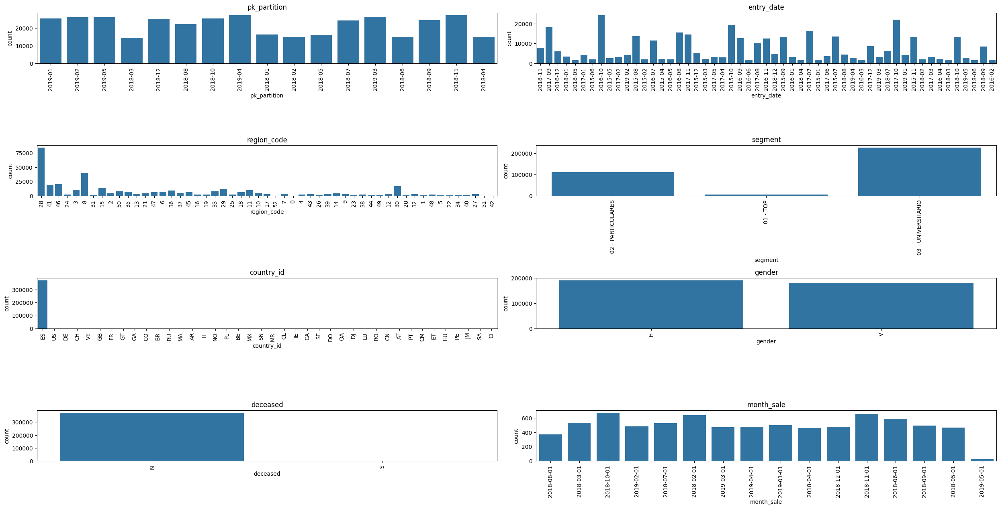

In [234]:
import matplotlib.pyplot as plt
import seaborn as sns

categoricas = ['pk_partition', 'entry_date', 'region_code', 
               'segment', 'country_id', 'gender', 'deceased', 'month_sale']
filas, cols_grid = 5, 2
fig, axes = plt.subplots(filas, cols_grid, figsize=(25, 15))
axes = axes.flatten()  # para recorrer fácilmente

# Graficar cada columna categórica
for i, col in enumerate(categoricas):
    if i < filas * cols_grid:
        sns.countplot(x=col, data=df_eda, ax=axes[i])
        axes[i].set_title(col)
        axes[i].tick_params(axis='x', rotation=90)

# Ocultar subplots vacíos
for j in range(i+1, filas*cols_grid):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


#### - Imputacion de nulos en Categoria

In [235]:
# nulos en Categorias
nulos_categorias = umbral_columnas_nulos(df_eda, lista_categoricas, 0)


entry_channel : 7.491313524050932 % nulos
segment : 7.544748105623252 % nulos
gender : 0.0002685154852880366 % nulos
month_sale : 97.89134789403306 % nulos


Podemos eliminar el month_sale , debido que es un dato que ya tenemos en pk_partition y tiene mas del 90% en nulos 

In [236]:
del (df_eda['month_sale'])
lista_categoricas = eliminar_valores(lista_categoricas, ['month_sale'])


Para los elementos de entry_channel, segment  y gender como la cantidad es tan baja se puede tomar la moda como imputacion de los nulos 

In [237]:
df_eda['entry_channel'].fillna(df_eda['entry_channel'].mode()[0] , inplace= True)
df_eda['segment'].fillna(df_eda['segment'].mode()[0], inplace=True)
df_eda['gender'].fillna(df_eda['gender'].mode()[0], inplace=True)


C:\Users\angel\AppData\Local\Temp\ipykernel_9648\4214265439.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_eda['entry_channel'].fillna(df_eda['entry_channel'].mode()[0] , inplace= True)
C:\Users\angel\AppData\Local\Temp\ipykernel_9648\4214265439.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values alw

In [238]:
# nulos en Categorias
nulos_categorias = umbral_columnas_nulos(df_eda, lista_categoricas, 0)


In [239]:
balanceados_categoricas , no_balanceados_categoricas = listas_balanceadas(df_eda,lista_categoricas , 50)

Columna: entry_channel, Valor: 'KHE', Participación: 60.06%
Columna: segment, Valor: '03 - UNIVERSITARIO', Participación: 68.19%
Columna: country_id, Valor: 'ES', Participación: 99.96%
Columna: gender, Valor: 'H', Participación: 51.42%
Columna: deceased, Valor: 'N', Participación: 99.98%


En country_id no ofrece ningun valor debido a que el 99.96% son de ES , lo mismo pasa con deceases con 99.98% , por ello no los tomare en cuenta ya que no ofrece ningun valor

In [240]:
del (df_eda['country_id'])
lista_categoricas = eliminar_valores(lista_categoricas, ['country_id'])


In [241]:
del (df_eda['deceased'])
lista_categoricas = eliminar_valores(lista_categoricas, ['deceased'])


In [242]:
categorias_uniq_mayor , categorias_uniq_menor = segmentacion_categorias_menor_umbral(df_eda ,lista_categoricas , 15 )

segment  :  3
gender  :  2


In [243]:
print(categorias_uniq_mayor)


['pk_partition', 'entry_date', 'region_code', 'entry_channel']


In [244]:
tabla_pareto , resumen_pareto , listas_valores_categoricos = pareto_por_columna(df_eda , categorias_uniq_mayor ,0.95)

Columna
entry_channel     6
entry_date       42
pk_partition     15
region_code      37
Name: Valor, dtype: int64


In [245]:
print("principales elementos de entry_channel  : ",
      listas_valores_categoricos['entry_channel'])
print("principales elementos de region_code : ",
      listas_valores_categoricos['region_code'])
print("principales elementos de entry_date : ",
      listas_valores_categoricos['entry_date'])


principales elementos de entry_channel  :  ['KHE', 'KFC', 'KAT', 'KHQ', 'KHK', 'KHM']
principales elementos de region_code :  ['28', '8', '46', '41', '30', '15', '29', '3', '11', '36', '33', '50', '6', '35', '47', '18', '45', '37', '10', '14', '21', '2', '39', '12', '13', '7', '17', '43', '32', '27', '9', '25', '48', '24', '4', '38', '19']
principales elementos de entry_date :  ['2016-10', '2017-10', '2015-10', '2017-09', '2017-07', '2016-08', '2017-11', '2015-08', '2015-07', '2015-09', '2015-11', '2018-10', '2016-09', '2016-11', '2016-07', '2017-08', '2017-12', '2018-09', '2018-11', '2018-07', '2016-12', '2015-12', '2018-12', '2018-08', '2017-01', '2019-01', '2019-02', '2017-06', '2018-01', '2016-01', '2017-02', '2017-05', '2017-03', '2019-03', '2017-04', '2019-04', '2019-05', '2015-05', '2015-03', '2015-04', '2016-04', '2018-02']


In [246]:
df_eda[lista_categoricas].describe().T


,count,unique,top,freq
pk_partition,372418,17,2018-11,27314
entry_date,372418,53,2016-10,24173
region_code,372418,53,28,83594
entry_channel,372418,67,KHE,223663
segment,372418,3,03 - UNIVERSITARIO,253948
gender,372418,2,H,191506


### Analisis Numericas sobre dataset por cliente

In [247]:
df_eda[lista_numericas].describe()

,age,salary,total_net_margin,diff_meses,cantidad_de_meses,suma_acumulada_active
count,372418.0000,264474.0000,7853.0000,372418.0000,372418.0000,372418.0000
mean,30.5128,117216.4393,2183.4183,19.8998,7.1610,2.5643
std,12.2235,210164.4015,3068.4518,13.3013,4.8270,4.5780
min,17.0000,1202.7300,38.0000,0.0000,1.0000,0.0000
25%,22.0000,61701.1725,62.6000,8.0000,3.0000,0.0000
50%,25.0000,89218.2900,77.9000,19.0000,6.0000,0.0000
75%,35.0000,133080.3600,4499.6000,31.0000,11.0000,3.0000
max,105.0000,28894395.5100,17829.4000,52.0000,17.0000,17.0000


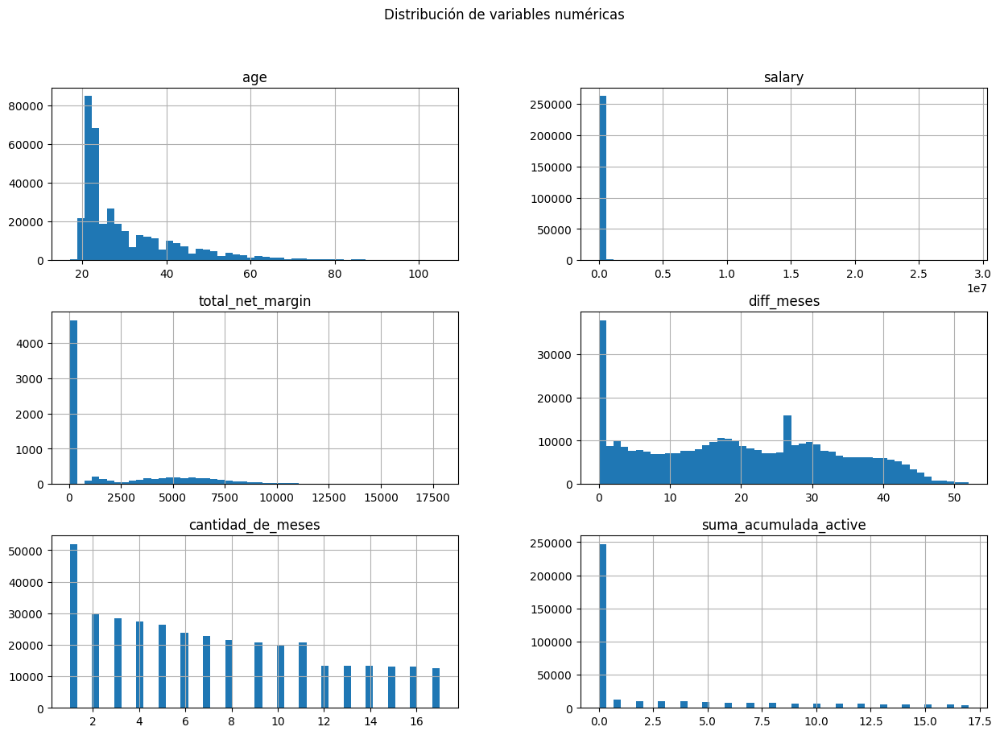

In [248]:
numericas = lista_numericas  # Para no explotar visualmente

df_eda[numericas].hist(bins=50, figsize=(15, 10))
plt.suptitle("Distribución de variables numéricas")
plt.show()


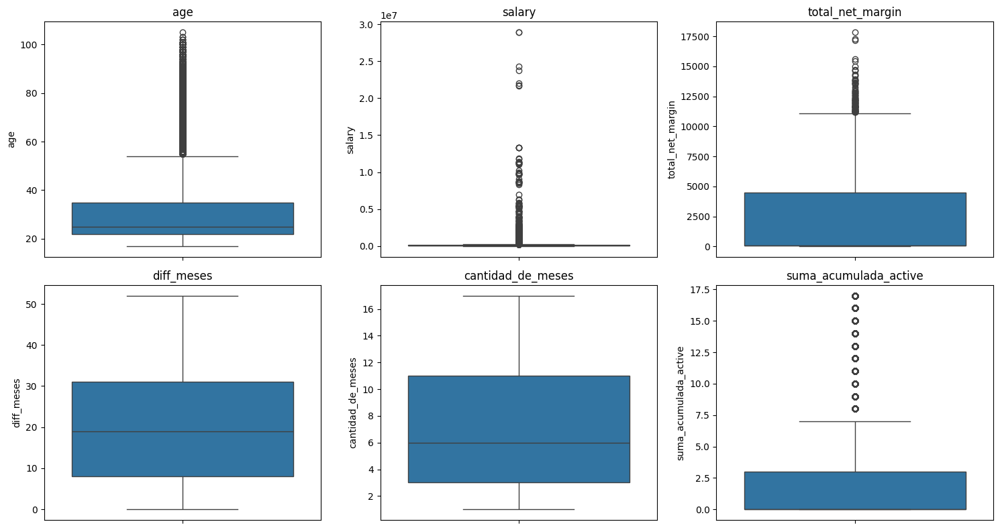

In [249]:
filas, cols_grid = 2, 3     # Ajusta según la cantidad de columnas
fig, axes = plt.subplots(filas, cols_grid, figsize=(15, 8))
axes = axes.flatten()  # facilita recorrer los subplots

for i, col in enumerate(numericas):
    if i < filas * cols_grid:
        sns.boxplot(y=col, data=df_eda, ax=axes[i])
        axes[i].set_title(col)

# Ocultar subplots vacíos
for j in range(i+1, filas * cols_grid):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


#### - Imputacion de nulos en Numericos

In [250]:
nulos_numeros = umbral_columnas_nulos(df_eda, lista_numericas, 0)


salary : 28.98463554393182 % nulos
total_net_margin : 97.89134789403306 % nulos


El total_net_margin es un valor con una enorme cantidad de nulos debido a que solo se encuentra cuando ahiuna venta y no genera un valor al modelo , se procede a eliminar

In [251]:
del(df_eda["total_net_margin"])
lista_numericas = eliminar_valores(lista_numericas, ["total_net_margin"])


<Axes: ylabel='salary'>

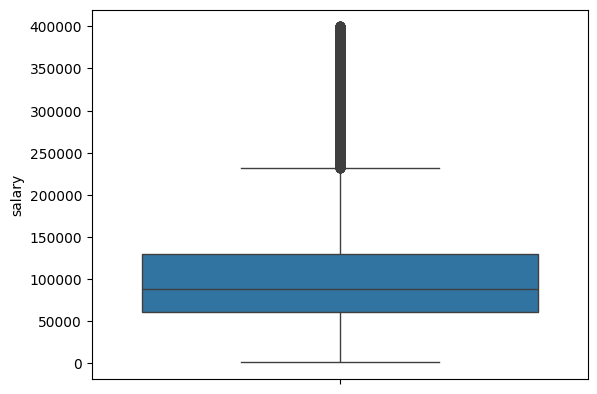

In [252]:
sns.boxplot(y="salary", data=df_eda[df_eda["salary"]<400000])


Elijo hacer la imputacion de salario con la mediana con los nulos debido al gran sesgo que tiene los datos

In [253]:
df_eda["salary"].fillna(df_eda["salary"].median() , inplace=True )


C:\Users\angel\AppData\Local\Temp\ipykernel_9648\183422110.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_eda["salary"].fillna(df_eda["salary"].median() , inplace=True )


In [254]:
nulos_numeros = umbral_columnas_nulos(df_eda, lista_numericas, 0)


### Analisis Boleanos sobre dataset por cliente

In [255]:
nulos_boleanos = umbral_columnas_nulos(df_eda, lista_boolean , 0)

payroll : 0.001879608397016256 % nulos
pension_plan : 0.001879608397016256 % nulos


Como es muy pequeña la parte de los nulos en los boleanos , procedo a poner la moda de los boleanos

In [256]:

df_eda["payroll"].fillna(df_eda["payroll"].mode()[0] , inplace=True)
df_eda["pension_plan"].fillna(df_eda["pension_plan"].mode()[0], inplace=True)


C:\Users\angel\AppData\Local\Temp\ipykernel_9648\2940800230.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_eda["payroll"].fillna(df_eda["payroll"].mode()[0] , inplace=True)
C:\Users\angel\AppData\Local\Temp\ipykernel_9648\2940800230.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves a

In [257]:
nulos_boleanos = umbral_columnas_nulos(df_eda, lista_boolean, 0)


In [258]:
# Esto transforma los decimales en boleanos

df_eda[lista_boolean] = df_eda[lista_boolean].astype(int)



In [259]:
balanceados_boleanos , no_balanceados_boleanos = listas_balanceadas(df_eda,lista_boolean , 95)

Columna: short_term_deposit, Valor: '0', Participación: 99.5%
Columna: loans, Valor: '0', Participación: 99.99%
Columna: mortgage, Valor: '0', Participación: 99.99%
Columna: funds, Valor: '0', Participación: 99.71%
Columna: securities, Valor: '0', Participación: 99.69%
Columna: long_term_deposit, Valor: '0', Participación: 98.52%
Columna: credit_card, Valor: '0', Participación: 98.93%
Columna: payroll_account, Valor: '0', Participación: 96.27%
Columna: emc_account, Valor: '0', Participación: 95.93%
Columna: em_account_p, Valor: '0', Participación: 100.0%
Columna: product_desc_credit_card, Valor: '0', Participación: 99.92%
Columna: product_desc_debit_card, Valor: '0', Participación: 99.45%
Columna: product_desc_em_acount, Valor: '0', Participación: 99.23%
Columna: product_desc_emc_account, Valor: '0', Participación: 99.95%
Columna: product_desc_funds, Valor: '0', Participación: 99.99%
Columna: product_desc_loans, Valor: '0', Participación: 100.0%
Columna: product_desc_long_term_deposit,

In [260]:
eliminar_columnas_boleanas = ['mortgage', 'em_account_p', 'product_desc_loans', 'product_desc_mortgage', 'family_product_loan', 'em_account_pp']
eliminar_columnas(df_eda ,eliminar_columnas_boleanas )

In [262]:
lista_boolean = eliminar_valores(lista_boolean, eliminar_columnas_boleanas)


In [263]:
df_eda[lista_boolean].describe()

,active_customer,short_term_deposit,loans,funds,securities,long_term_deposit,credit_card,payroll_account,emc_account,debit_card,em_acount,product_desc_credit_card,product_desc_debit_card,product_desc_em_acount,product_desc_emc_account,product_desc_funds,product_desc_long_term_deposit,product_desc_payroll,product_desc_payroll_account,product_desc_pension_plan,product_desc_securities,product_desc_short_term_deposit,family_product_account,family_product_investment,family_product_payment_card,family_product_pension_plan,payroll,pension_plan
count,372418.0000,372418.0000,372418.0000,372418.0000,372418.0000,372418.0000,372418.0000,372418.0000,372418.0000,372418.0000,372418.0000,372418.0000,372418.0000,372418.0000,372418.0000,372418.0000,372418.0000,372418.0000,372418.0000,372418.0000,372418.0000,372418.0000,372418.0000,372418.0000,372418.0000,372418.0000,372418.0000,372418.0000
mean,0.3220,0.0050,0.0001,0.0029,0.0031,0.0148,0.0107,0.0373,0.0407,0.0782,0.5929,0.0008,0.0055,0.0077,0.0005,0.0001,0.0009,0.0067,0.0010,0.0071,0.0002,0.0004,0.0141,0.0015,0.0063,0.0071,0.0239,0.0256
std,0.4673,0.0704,0.0079,0.0535,0.0557,0.1207,0.1028,0.1896,0.1976,0.2684,0.4913,0.0280,0.0742,0.0875,0.0225,0.0118,0.0305,0.0817,0.0321,0.0837,0.0128,0.0188,0.1179,0.0393,0.0791,0.0837,0.1527,0.1581
min,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
25%,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
50%,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
75%,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
max,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


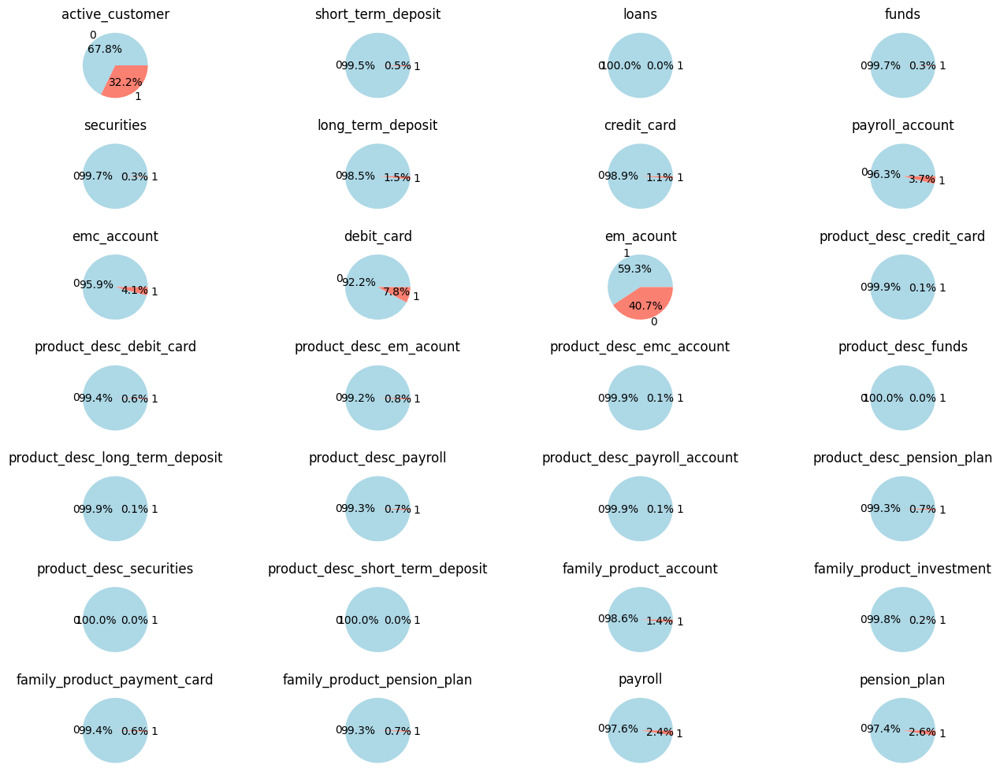

In [264]:
booleanas = lista_boolean  # tu lista de columnas booleanas
filas, cols_grid = 7, 4     # Ajusta según la cantidad de columnas
fig, axes = plt.subplots(filas, cols_grid, figsize=(15, 10))
axes = axes.flatten()

for i, col in enumerate(booleanas):
    if i < filas * cols_grid:
        counts = df_eda[col].value_counts()
        axes[i].pie(counts, labels=counts.index, autopct='%1.1f%%',
                    colors=['lightblue', 'salmon'])
        axes[i].set_title(col)

# Ocultar subplots vacíos
for j in range(i+1, filas * cols_grid):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


## 🔹 5. Coorelacion

✔️ Identificar coorrelaciones entre columnas

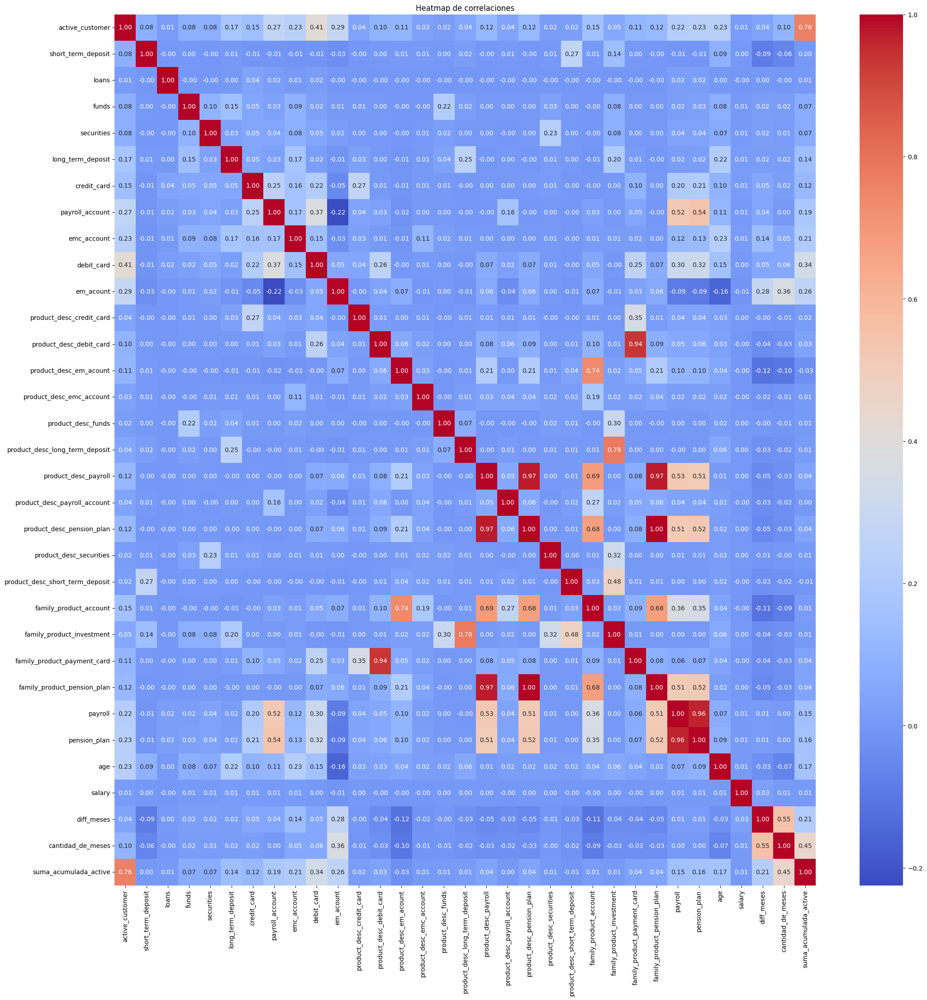

In [265]:
# Columnas numéricas
cols_corr = lista_boolean + lista_numericas
df_corr = df_eda[cols_corr].corr()

plt.figure(figsize=(25, 25))
sns.heatmap(df_corr, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Heatmap de correlaciones")
plt.show()


## 🔹 6. Análisis del Tarjet

✔️ Gráficos:Boxplots(numérica vs tarjet)



In [266]:
df_eda['sales_account'].value_counts()

sales_account
0    319545
1     52873
Name: count, dtype: int64

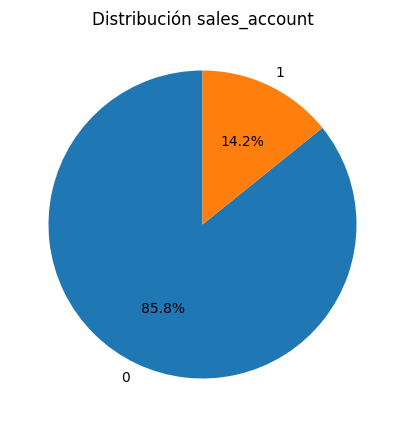

In [267]:

conteo = df_eda['sales_account'].value_counts()

plt.figure(figsize=(5, 5))
plt.pie(conteo,
        labels=conteo.index,
        autopct='%1.1f%%',
        startangle=90)

plt.title('Distribución sales_account')
plt.show()


## 🔹 7. Análisis bivariante  -> Variable  vs variable Tarjet
🏷️ Variable  vs variable Tarjet

✔️ Gráficos:


### - Numericas

In [269]:
df_eda['Cat_target'] =  np.where(df_eda['sales_account'] == 0, 'No Venta',"Venta" )

In [268]:
lista_numericas


['age', 'salary', 'diff_meses', 'cantidad_de_meses', 'suma_acumulada_active']

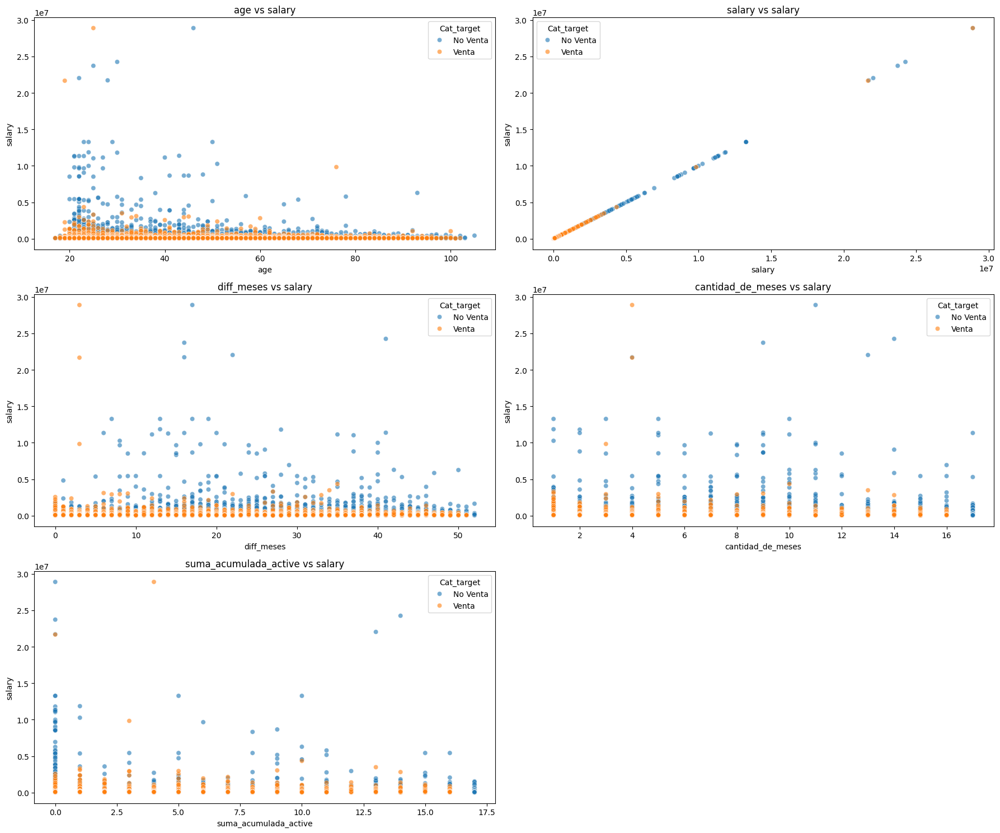

In [270]:
numericas = lista_numericas
tar = "salary"

filas, cols_grid = 3, 2
fig, axes = plt.subplots(filas, cols_grid, figsize=(18, 15))
axes = axes.flatten()

for i, col in enumerate(numericas):
    if i < filas * cols_grid:
        sns.scatterplot(x=col, y=tar, hue='Cat_target',
                        data=df_eda, ax=axes[i], alpha=0.6)
        axes[i].set_title(f"{col} vs {tar}")

# Ocultar subplots vacíos
for j in range(i+1, filas*cols_grid):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


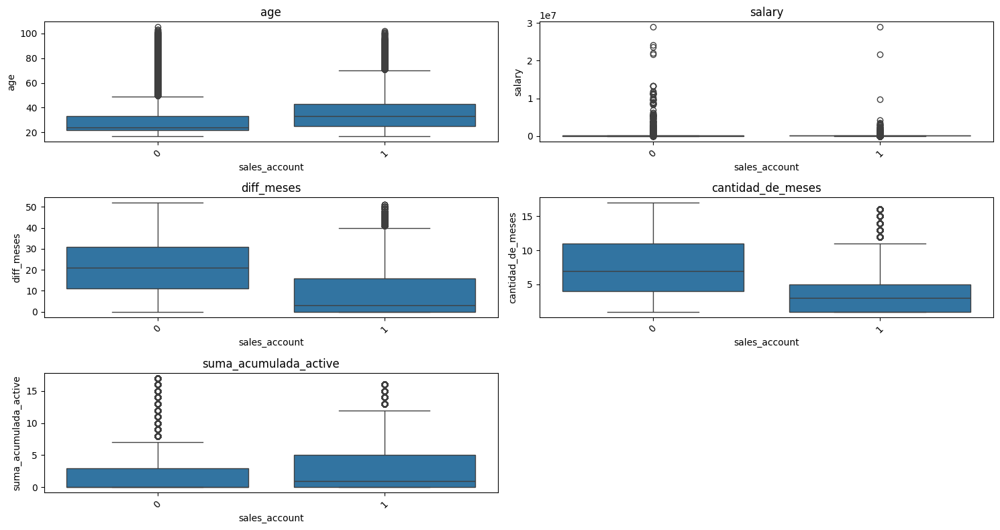

In [271]:
tar = 'sales_account'
filas, cols_grid = 3, 2
fig, axes = plt.subplots(filas, cols_grid, figsize=(15, 8))
axes = axes.flatten()  # para recorrer fácilmente

# Recorrer columnas y dibujar boxplot
for i, col in enumerate(lista_numericas):
    if i < filas * cols_grid:
        sns.boxplot(x=tar, y=col, data=df_eda, ax=axes[i])
        axes[i].set_title(col)
        axes[i].tick_params(axis='x', rotation=45)

# Si quedan subplots vacíos, los ocultamos
for j in range(i+1, filas*cols_grid):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


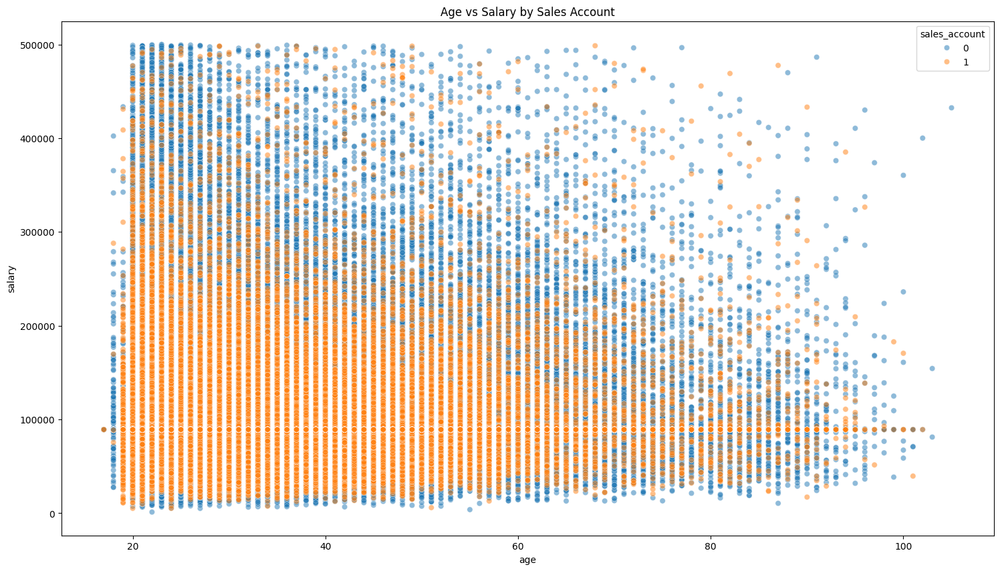

In [272]:
plt.figure(figsize=(18, 10))

sns.scatterplot(
    x="age",
    y="salary",
    hue="sales_account",
    data=df_eda[df_eda['salary'] < 500000],
    alpha=0.5
)

plt.title("Age vs Salary by Sales Account")
plt.show()


<Axes: xlabel='sales_account', ylabel='salary'>

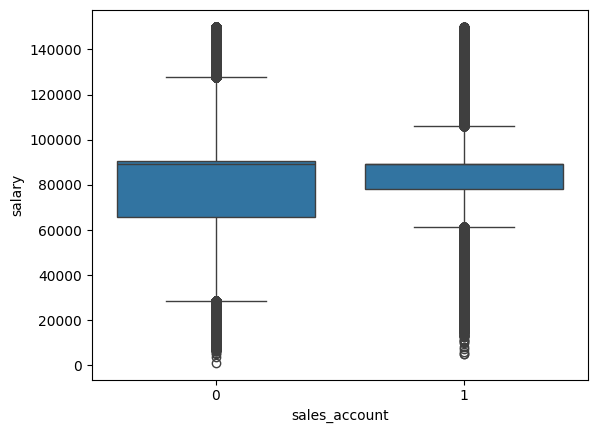

In [273]:
sns.boxplot(x='sales_account', y='salary', data=df_eda[((df_eda['salary']>0) & (df_eda['salary']<150000))])

### - Categorias 

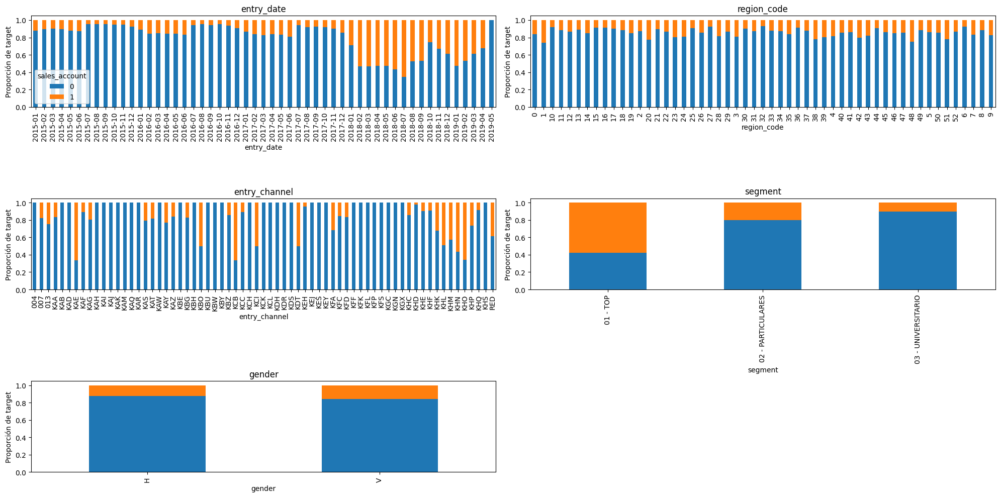

In [275]:

fig, axes = plt.subplots(3, 2, figsize=(20, 10))
axes = axes.flatten()  # para poder iterar fácilmente

for i, col in enumerate(['entry_date',  'region_code',   'entry_channel',
                         'segment',  'gender']):
    prop = pd.crosstab(df_eda[col], df_eda['sales_account'], normalize='index')
    prop.plot(kind='bar', stacked=True, ax=axes[i], legend=(i==0))  # solo mostrar leyenda en el primer gráfico
    axes[i].set_ylabel('Proporción de target')
    axes[i].set_title(col)

# Eliminar subplots vacíos si los hay
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

### - Boleanas

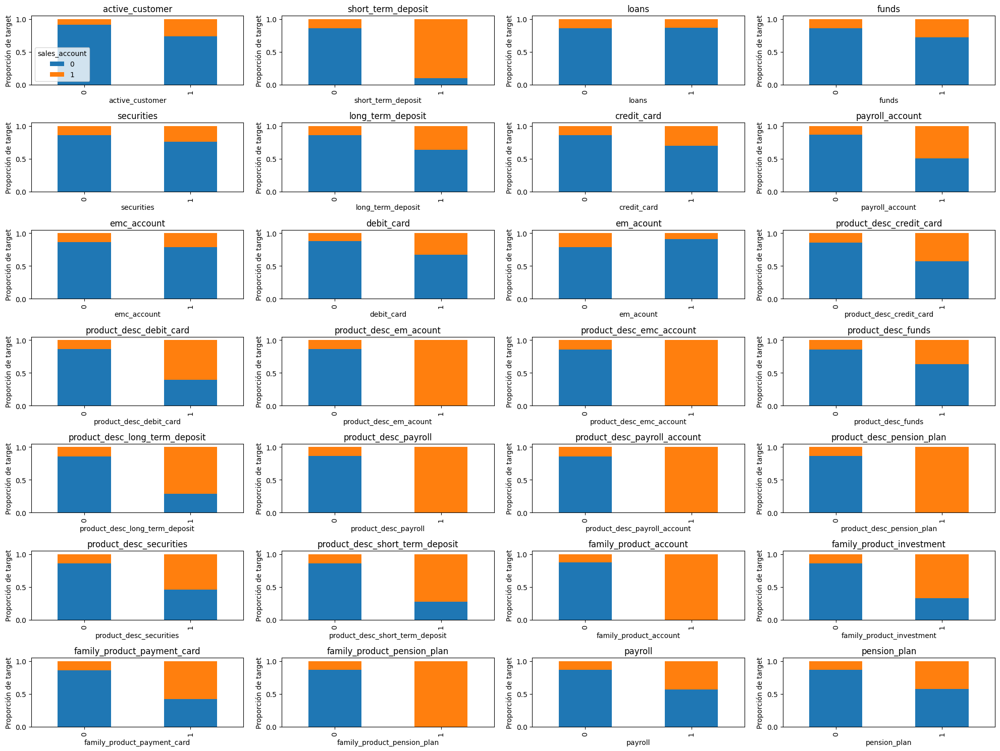

In [276]:

fig, axes = plt.subplots(7, 4, figsize=(20, 15))
axes = axes.flatten()  # para poder iterar fácilmente

for i, col in enumerate(lista_boolean):
    prop = pd.crosstab(df_eda[col], df_eda['sales_account'], normalize='index')
    prop.plot(kind='bar', stacked=True, ax=axes[i], legend=(i==0))  # solo mostrar leyenda en el primer gráfico
    axes[i].set_ylabel('Proporción de target')
    axes[i].set_title(col)

# Eliminar subplots vacíos si los hay
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


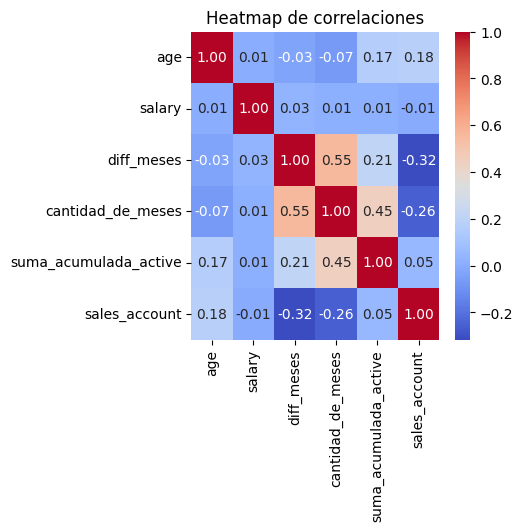

In [277]:
# Columnas numéricas 
cols_corr = lista_numericas + ["sales_account"]  # reemplaza con tu target
df_corr = df_eda[cols_corr].corr()

plt.figure(figsize=(4, 4))
sns.heatmap(df_corr, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Heatmap de correlaciones")
plt.show()


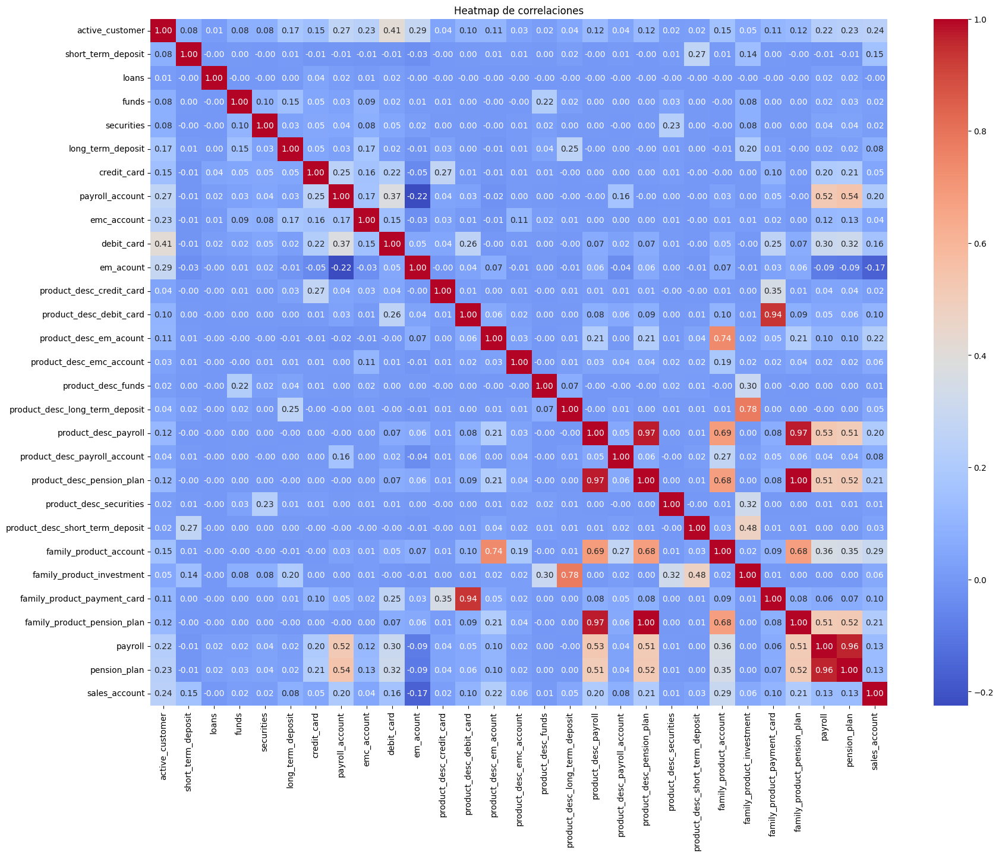

In [278]:
# Columnas numéricas + target
cols_corr = lista_boolean + ["sales_account"]  # reemplaza con tu target
df_corr = df_eda[cols_corr].corr()

plt.figure(figsize=(20, 15))
sns.heatmap(df_corr, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Heatmap de correlaciones")
plt.show()

✔️ Estadísticos:

Correlaciones

Chi-square 

In [279]:
print(lista_categoricas)

['pk_partition', 'entry_date', 'region_code', 'entry_channel', 'segment', 'gender']


In [280]:
columnas = lista_boolean + ['entry_date', 'region_code',
                            'entry_channel', 'segment', 'gender']  # tus variables
tar = "sales_account"  # tu target
resultados = []

for col in columnas:
    # Tabla de contingencia: counts de cada combinación de categoría vs target
    tabla = pd.crosstab(df_eda[col], df_eda[tar])
    
    # Test de chi-cuadrado
    chi2, p, dof, ex = chi2_contingency(tabla)
    
    resultados.append({
        "variable": col,
        "chi2": chi2,
        "p_value": p
    })

# Convertir a dataframe y ordenar por p-value
df_chi2 = pd.DataFrame(resultados).sort_values("p_value")
df_chi2


,variable,chi2,p_value
0,active_customer,21776.9661,0.0000
19,product_desc_pension_plan,15986.5267,0.0000
18,product_desc_payroll_account,2310.0488,0.0000
17,product_desc_payroll,15210.2283,0.0000
31,segment,16316.5494,0.0000
24,family_product_payment_card,3758.7430,0.0000
13,product_desc_em_acount,17497.3876,0.0000
12,product_desc_debit_card,3675.0526,0.0000
25,family_product_pension_plan,15986.5267,0.0000
10,em_acount,10179.1151,0.0000


## 🔹 8. Análisis multivariante

✔️ Matrices de correlación


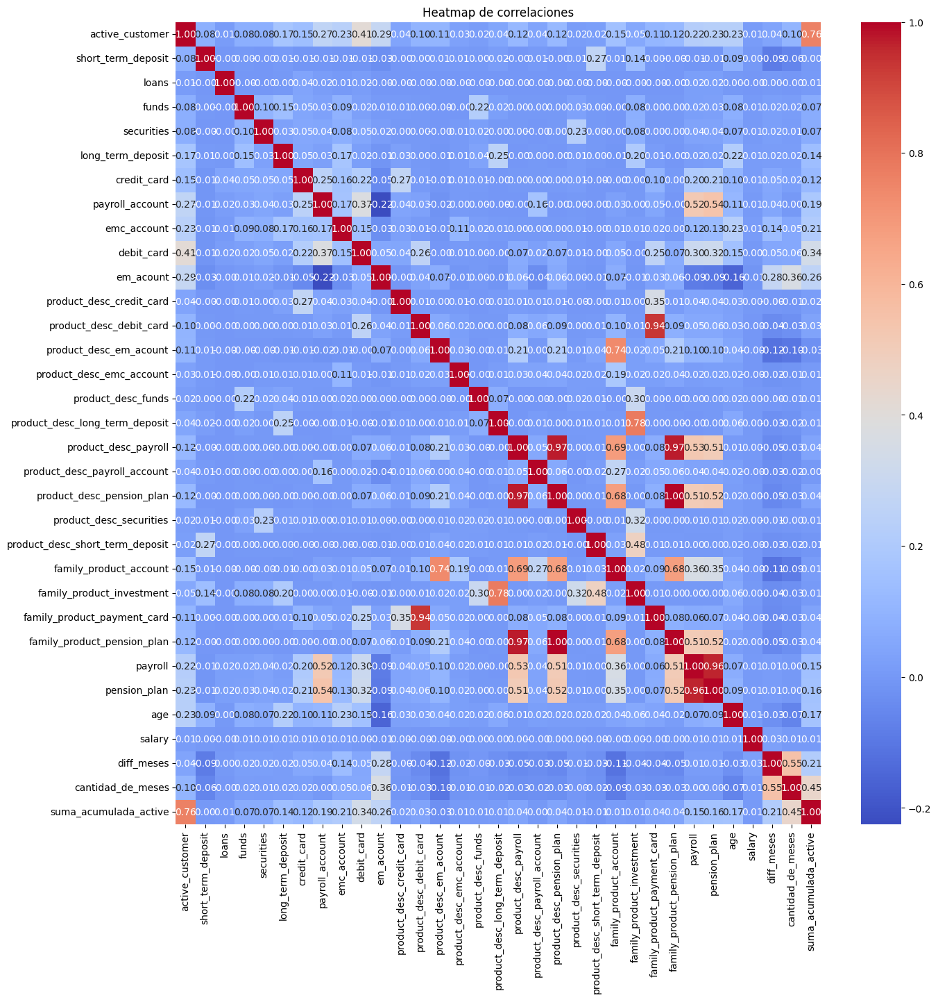

In [281]:
# Columnas numéricas 
cols_corr = lista_boolean + lista_numericas  # reemplaza con tu target
df_corr = df_eda[cols_corr].corr()

plt.figure(figsize=(15, 15))
sns.heatmap(df_corr, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Heatmap de correlaciones")
plt.show()

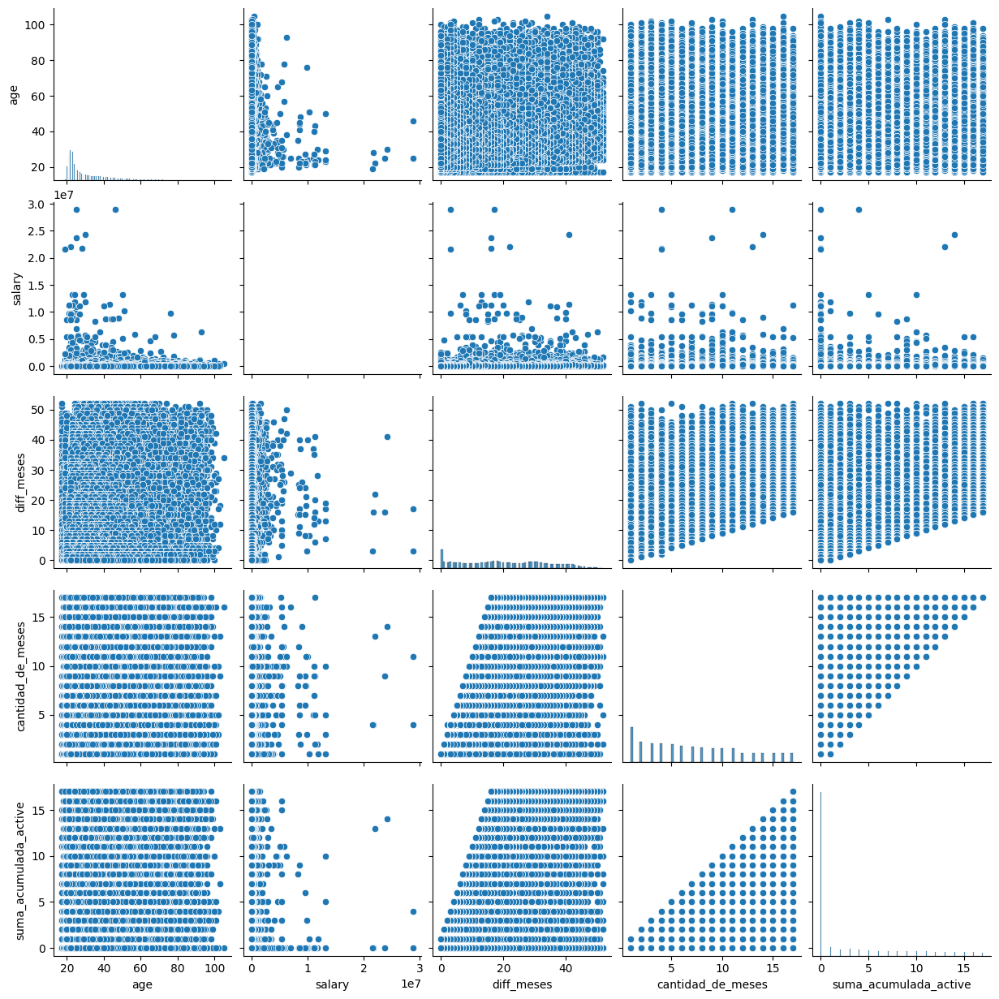

In [282]:
sns.pairplot(df_eda[lista_numericas] )

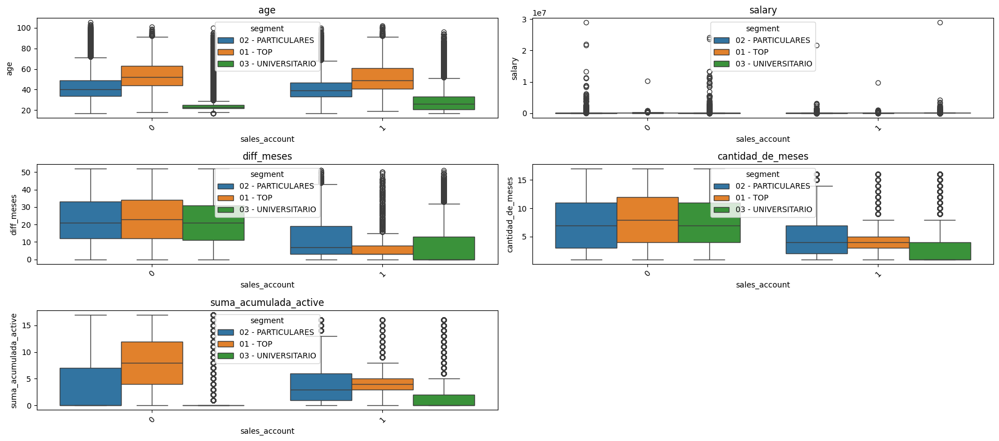

In [283]:
tar = 'sales_account'
filas, cols_grid = 3, 2
fig, axes = plt.subplots(filas, cols_grid, figsize=(18, 8))
axes = axes.flatten()  # para recorrer fácilmente

# Recorrer columnas y dibujar boxplot
for i, col in enumerate(lista_numericas):
    if i < filas * cols_grid:
        sns.boxplot(x=tar, y=col,hue='segment' , data=df_eda, ax=axes[i])
        axes[i].set_title(col)
        axes[i].tick_params(axis='x', rotation=45)

# Si quedan subplots vacíos, los ocultamos
for j in range(i+1, filas*cols_grid):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [284]:
print(lista_categoricas)

['pk_partition', 'entry_date', 'region_code', 'entry_channel', 'segment', 'gender']


In [285]:
print(lista_numericas)


['age', 'salary', 'diff_meses', 'cantidad_de_meses', 'suma_acumulada_active']


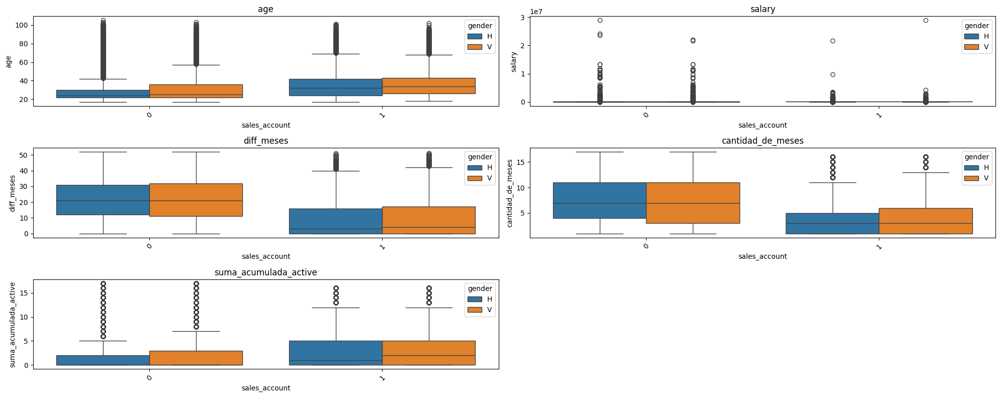

In [286]:
tar = 'sales_account'
filas, cols_grid = 3, 2
fig, axes = plt.subplots(filas, cols_grid, figsize=(20, 8))
axes = axes.flatten()  # para recorrer fácilmente

# Recorrer columnas y dibujar boxplot
for i, col in enumerate(lista_numericas):
    if i < filas * cols_grid:
        sns.boxplot(x=tar, y=col, hue='gender', data=df_eda, ax=axes[i])
        axes[i].set_title(col)
        axes[i].tick_params(axis='x', rotation=45)

# Si quedan subplots vacíos, los ocultamos
for j in range(i+1, filas*cols_grid):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

## 🔹 9. Detección y análisis de outliers

✔️ Método IQR, boxplots, z-scores
✔️ Decidir si eliminarlos, recortarlos o transformarlos.

- Para numeros

In [287]:
lista_numericas

['age', 'salary', 'diff_meses', 'cantidad_de_meses', 'suma_acumulada_active']

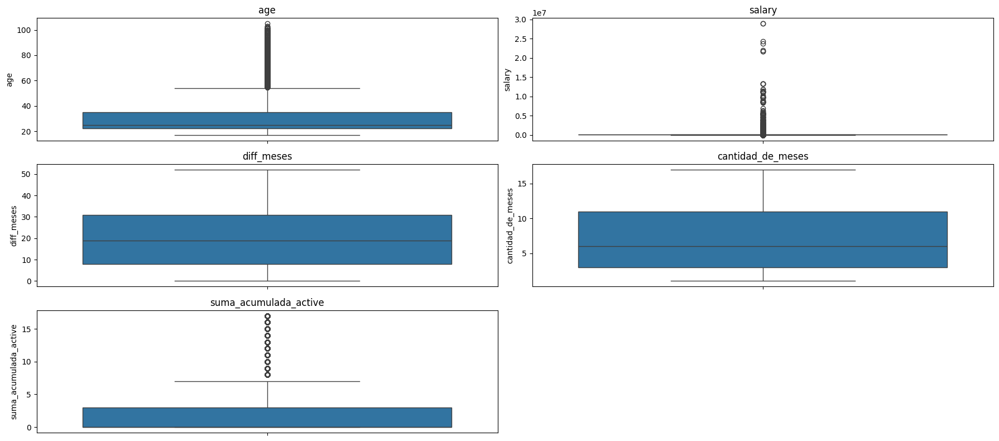

In [288]:
filas, cols_grid = 3, 2    # Ajusta según la cantidad de columnas
fig, axes = plt.subplots(filas, cols_grid, figsize=(18, 8))
axes = axes.flatten()  # facilita recorrer los subplots

for i, col in enumerate(numericas):
    if i < filas * cols_grid:
        sns.boxplot(y=col, data=df_eda, ax=axes[i])
        axes[i].set_title(col)

# Ocultar subplots vacíos
for j in range(i+1, filas * cols_grid):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [289]:
lista_categoricas

['pk_partition',
 'entry_date',
 'region_code',
 'entry_channel',
 'segment',
 'gender']

<Axes: xlabel='segment', ylabel='salary'>

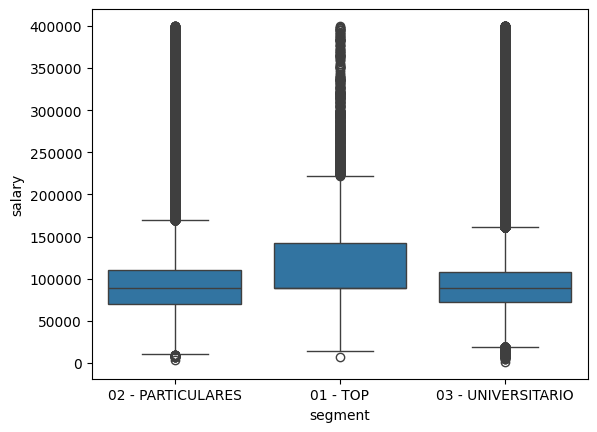

In [290]:
sns.boxplot(x='segment', y='salary', data=df_eda[(
    (df_eda['salary'] > 0) & (df_eda['salary'] < 400000))])
# data=df_tabla_f[((df_tabla_f['salary']>0) & (df_tabla_f['salary']<1000000) &(df_tabla_f['sales_account']>0))]


## 🔹 10. Transformaciones y feature engineering


In [33]:
df_eda = pd.read_csv(
    "data\processed\output_raw_trabajado.csv", sep="|", low_memory=False)


In [34]:
lista_numericas = ['age', 'salary', 'diff_meses',
                   'cantidad_de_meses', 'suma_acumulada_active']
lista_boolean = ['active_customer', 'short_term_deposit', 'loans', 'funds', 'securities', 'long_term_deposit', 'credit_card', 'payroll_account', 'emc_account', 'debit_card', 'em_acount', 'product_desc_credit_card', 'product_desc_debit_card', 'product_desc_em_acount', 'product_desc_emc_account', 'product_desc_funds',
                 'product_desc_long_term_deposit', 'product_desc_payroll', 'product_desc_payroll_account', 'product_desc_pension_plan', 'product_desc_securities', 'product_desc_short_term_deposit', 'family_product_account', 'family_product_investment', 'family_product_payment_card', 'family_product_pension_plan', 'payroll', 'pension_plan']

lista_categoricas = ['pk_partition', 'entry_date', 'region_code', 'entry_channel', 'segment', 'gender']


In [35]:
bool_cols = ['loans', 'funds', 'securities', 'long_term_deposit',
             'credit_card', 'payroll_account', 'emc_account', 'debit_card', 'em_acount', 'payroll', 'pension_plan']

familias = ['family_product_investment',
            'family_product_payment_card', 'family_product_pension_plan']

df_eda["n_products"] = df_eda[bool_cols].sum(axis=1)

df_eda["has_any_deposit"] = df_eda["short_term_deposit"] | df_eda["long_term_deposit"]
df_eda["has_investments"] = df_eda["funds"] | df_eda["securities"]
df_eda["full_payroll_relationship"] = df_eda["payroll"] & df_eda["payroll_account"]
df_eda["has_cards"] = df_eda["credit_card"] | df_eda["debit_card"]

df_eda["heavy_user"] = (df_eda["n_products"] >= 3).astype(int)
df_eda["segm_plus_client"] = df_eda["entry_channel"].isin(["KCB", "KAE", "KHO", "KHN", "KHL", "KDT"]).astype(int)
df_eda['otra_familia_flag'] = (df_eda[familias].sum(axis=1) > 0).astype(int)

df_eda["payroll_and_pension"] = df_eda["payroll"] & df_eda["pension_plan"]
df_eda['payroll_and_card'] = ( df_eda['payroll'] == 1) & (df_eda['has_cards'] == 1)
df_eda['payroll_and_card'] = df_eda['payroll_and_card'].astype(int)

boleanos = ["has_any_deposit", "has_investments","full_payroll_relationship", "has_cards", "heavy_user", "segm_plus_client", "otra_familia_flag", "payroll_and_pension", "payroll_and_card"]


df_eda["rel_age_segment"] = df_eda.groupby("segment")["age"].transform(lambda x: (x - x.mean()) / x.std())
df_eda["pension_x_payroll"] = df_eda["payroll"] * df_eda["pension_plan"]
df_eda["invest_x_age"] = df_eda["has_investments"] * df_eda["age"]
df_eda["cards_x_payroll"] = df_eda["has_cards"] * df_eda["payroll"]

numero = ["n_products", "rel_age_segment", "pension_x_payroll", "invest_x_age", "cards_x_payroll"]

bins = [16, 25, 35, 45, 55, 65, 200]
labels = ['17-24', '25-34', '35-44', '45-54', '55-64', '65+']
df_eda['age_group'] = pd.cut(df_eda['age'], bins=bins, labels=labels)


categoria = ["age_group"]



In [36]:
df_eda.head(5)

,pk_partition,entry_date,region_code,entry_channel,segment,gender,age,salary,diff_meses,cantidad_de_meses,suma_acumulada_active,active_customer,short_term_deposit,loans,funds,securities,long_term_deposit,credit_card,payroll_account,emc_account,debit_card,em_acount,product_desc_credit_card,product_desc_debit_card,product_desc_em_acount,product_desc_emc_account,product_desc_funds,product_desc_long_term_deposit,product_desc_payroll,product_desc_payroll_account,product_desc_pension_plan,product_desc_securities,product_desc_short_term_deposit,family_product_account,family_product_investment,family_product_payment_card,family_product_pension_plan,payroll,pension_plan,sales_account,Cat_target,n_products,has_any_deposit,has_investments,full_payroll_relationship,has_cards,heavy_user,segm_plus_client,otra_familia_flag,payroll_and_pension,payroll_and_card,rel_age_segment,pension_x_payroll,invest_x_age,cards_x_payroll,age_group
0,2019-01,2018-11,28,KAT,02 - PARTICULARES,H,62,89218.2900,2,3.0000,3.0000,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,No Venta,0,0,0,0,0,0,0,0,0,0,1.5691,0,0,0,55-64
1,2019-02,2017-09,28,KAT,02 - PARTICULARES,H,53,102405.7500,17,14.0000,14.0000,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,No Venta,2,1,0,0,0,0,0,0,0,0,0.8615,0,0,0,45-54
2,2019-05,2016-12,28,KAT,02 - PARTICULARES,V,55,407281.1100,29,11.0000,11.0000,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,No Venta,0,0,0,0,0,0,0,0,0,0,1.0187,0,0,0,45-54
3,2019-01,2018-01,28,KAT,02 - PARTICULARES,H,47,84511.8600,12,13.0000,13.0000,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,No Venta,1,0,0,0,0,0,0,0,0,0,0.3897,0,0,0,45-54
4,2019-01,2018-05,28,KFA,01 - TOP,V,77,282461.7900,8,9.0000,9.0000,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,No Venta,2,1,1,0,0,0,0,0,0,0,1.6429,0,77,0,65+


In [37]:
lista_boolean = lista_boolean + boleanos
lista_categoricas = lista_categoricas + categoria
lista_numericas = lista_numericas + numero


In [38]:
print("Listas de variables numericas")
print(lista_numericas)
print(len(lista_numericas))
print("\n Listas de variables boleanas")
print( lista_boolean)
print(len(lista_boolean))
print("\n Listas de variables categoricas")
print(lista_categoricas)
print(len(lista_categoricas))
print("Cantidad de columnas Totales ", len(df_eda.columns))

Listas de variables numericas
['age', 'salary', 'diff_meses', 'cantidad_de_meses', 'suma_acumulada_active', 'n_products', 'rel_age_segment', 'pension_x_payroll', 'invest_x_age', 'cards_x_payroll']
10

 Listas de variables boleanas
['active_customer', 'short_term_deposit', 'loans', 'funds', 'securities', 'long_term_deposit', 'credit_card', 'payroll_account', 'emc_account', 'debit_card', 'em_acount', 'product_desc_credit_card', 'product_desc_debit_card', 'product_desc_em_acount', 'product_desc_emc_account', 'product_desc_funds', 'product_desc_long_term_deposit', 'product_desc_payroll', 'product_desc_payroll_account', 'product_desc_pension_plan', 'product_desc_securities', 'product_desc_short_term_deposit', 'family_product_account', 'family_product_investment', 'family_product_payment_card', 'family_product_pension_plan', 'payroll', 'pension_plan', 'has_any_deposit', 'has_investments', 'full_payroll_relationship', 'has_cards', 'heavy_user', 'segm_plus_client', 'otra_familia_flag', 'payrol

In [39]:
total_lista = lista_numericas + lista_boolean + lista_categoricas + target
df_eda = df_eda[total_lista]


In [40]:

df_eda.head(2)

,age,salary,diff_meses,cantidad_de_meses,suma_acumulada_active,n_products,rel_age_segment,pension_x_payroll,invest_x_age,cards_x_payroll,active_customer,short_term_deposit,loans,funds,securities,long_term_deposit,credit_card,payroll_account,emc_account,debit_card,em_acount,product_desc_credit_card,product_desc_debit_card,product_desc_em_acount,product_desc_emc_account,product_desc_funds,product_desc_long_term_deposit,product_desc_payroll,product_desc_payroll_account,product_desc_pension_plan,product_desc_securities,product_desc_short_term_deposit,family_product_account,family_product_investment,family_product_payment_card,family_product_pension_plan,payroll,pension_plan,has_any_deposit,has_investments,full_payroll_relationship,has_cards,heavy_user,segm_plus_client,otra_familia_flag,payroll_and_pension,payroll_and_card,pk_partition,entry_date,region_code,entry_channel,segment,gender,age_group,sales_account
0,62,89218.2900,2,3.0000,3.0000,0,1.5691,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2019-01,2018-11,28,KAT,02 - PARTICULARES,H,55-64,0
1,53,102405.7500,17,14.0000,14.0000,2,0.8615,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,2019-02,2017-09,28,KAT,02 - PARTICULARES,H,45-54,0


### Para Boleanos
- elimino: em_account_pp (100.0%),em_account_p (100.0%) 
- Segun el peso que tiene hacia el tarjet podemos ver que las columnas que mas influyen al tarjet son :

['emc_account' ,'otra_familia_flag' ,'has_investments' ,'debit_card' ,'payroll' ,'em_acount',
'payroll_and_card', 'payroll_and_pension' ,'has_cards' ,'active_customer' ,'credit_card' ,
'full_payroll_relationship', 'securities', 'pension_plan', 'payroll_account']

### Para Boleanos
- elimino: em_account_pp (100.0%),em_account_p (100.0%) 
- Segun el peso que tiene hacia el tarjet podemos ver que las columnas que mas influyen al tarjet son :

['emc_account' ,'otra_familia_flag' ,'has_investments' ,'debit_card' ,'payroll' ,'em_acount',
'payroll_and_card', 'payroll_and_pension' ,'has_cards' ,'active_customer' ,'credit_card' ,
'full_payroll_relationship', 'securities', 'pension_plan', 'payroll_account']

In [41]:
print(lista_boolean)

['active_customer', 'short_term_deposit', 'loans', 'funds', 'securities', 'long_term_deposit', 'credit_card', 'payroll_account', 'emc_account', 'debit_card', 'em_acount', 'product_desc_credit_card', 'product_desc_debit_card', 'product_desc_em_acount', 'product_desc_emc_account', 'product_desc_funds', 'product_desc_long_term_deposit', 'product_desc_payroll', 'product_desc_payroll_account', 'product_desc_pension_plan', 'product_desc_securities', 'product_desc_short_term_deposit', 'family_product_account', 'family_product_investment', 'family_product_payment_card', 'family_product_pension_plan', 'payroll', 'pension_plan', 'has_any_deposit', 'has_investments', 'full_payroll_relationship', 'has_cards', 'heavy_user', 'segm_plus_client', 'otra_familia_flag', 'payroll_and_pension', 'payroll_and_card']


### Para numeros: 
- 'total_net_margin' : se elimina porque no ofrecen mucho peso al tarjet

- salary , n_products  y age tiene mucho sesgo se procede a dar el log : np.log(df['age'])
- diff_meses normalizar

['age', 'salary',  'n_products', 'diff_meses']


In [42]:
df_eda[lista_numericas].describe()

,age,salary,diff_meses,cantidad_de_meses,suma_acumulada_active,n_products,rel_age_segment,pension_x_payroll,invest_x_age,cards_x_payroll
count,372418.0000,372418.0000,372418.0000,372418.0000,372418.0000,372418.0000,372418.0000,372418.0000,372418.0000,372418.0000
mean,30.5128,109101.2777,19.8998,7.1610,2.5643,0.8302,0.0000,0.0239,0.2667,0.0147
std,12.2235,177561.6787,13.3013,4.8270,4.5780,0.8441,1.0000,0.1527,3.6976,0.1205
min,17.0000,1202.7300,0.0000,1.0000,0.0000,0.0000,-2.4007,0.0000,0.0000,0.0000
25%,22.0000,72215.1300,8.0000,3.0000,0.0000,0.0000,-0.5539,0.0000,0.0000,0.0000
50%,25.0000,89218.2900,19.0000,6.0000,0.0000,1.0000,-0.2978,0.0000,0.0000,0.0000
75%,35.0000,111318.9150,31.0000,11.0000,3.0000,1.0000,0.2324,0.0000,0.0000,0.0000
max,105.0000,28894395.5100,52.0000,17.0000,17.0000,9.0000,12.1111,1.0000,97.0000,1.0000


In [43]:
df_eda[lista_numericas].skew()


age                      1.8205
salary                  72.1791
diff_meses               0.1393
cantidad_de_meses        0.4294
suma_acumulada_active    1.7304
n_products               1.9442
rel_age_segment          3.0568
pension_x_payroll        6.2353
invest_x_age            15.0461
cards_x_payroll          8.0515
dtype: float64

In [44]:
MinMax = MinMaxScaler()  # Definimos la función de sklearn que vamos a usar

df_eda[lista_numericas] = MinMax.fit_transform(df_eda[lista_numericas])


### Para Caregorias
- elimino:  country_id y deceased , muy desbalanceado
- en region_code aquellos que no tienen seran puestos como otros y los demas seran concatenados con el codigo de region con la comunidad autonoma
- luego se procede a realizar un OHE a entry_channel ,region_code ,gender ,segment (para los nulos region_code  se pone una categoria de otros)
- para segment y entry_channel la moda
- en cuanto a las fechas se separa por año y mes a las pk_partition y entry_date
- se elimina pk_cid


### Para Categorias
- elimino:  country_id y deceased , muy desbalanceado
- en region_code aquellos que no tienen seran puestos como otros y los demas seran concatenados con el codigo de region con la comunidad autonoma
- luego se procede a realizar un OHE a entry_channel ,region_code ,gender ,segment (para los nulos entry_channel ,region_code  se pone una categoria de otros)
- para segment  la moda
- en cunato a las fechas se separa por año y mes a las pk_partition y entry_date
- se elimina pk_cid



In [45]:
print(lista_categoricas)
df_eda[lista_categoricas] = df_eda[lista_categoricas].astype(object)


['pk_partition', 'entry_date', 'region_code', 'entry_channel', 'segment', 'gender', 'age_group']


In [46]:
balanceados_categoricas , no_balanceados_categoricas = listas_balanceadas(df_eda,lista_categoricas , 50)

Columna: entry_channel, Valor: 'KHE', Participación: 60.06%
Columna: segment, Valor: '03 - UNIVERSITARIO', Participación: 68.19%
Columna: gender, Valor: 'H', Participación: 51.42%
Columna: age_group, Valor: '17-24', Participación: 51.94%


In [47]:
df_eda[lista_categoricas].describe().T


,count,unique,top,freq
pk_partition,372418,17,2018-11,27314
entry_date,372418,53,2016-10,24173
region_code,372418,53,28,83594
entry_channel,372418,67,KHE,223663
segment,372418,3,03 - UNIVERSITARIO,253948
gender,372418,2,H,191506
age_group,372418,6,17-24,193441


Las columnas con mayor cantidad de registros unicos son : region_code , entry_channel y Comunidad_autonoma de las cuales entry_channel tiene en el Valor 'KHE' el 60.06% de su total.
Hallaremos los valores que son el 95% de toda la data de estos registros y lo demas lo pondremos en una categoria de otros

In [48]:
categorias_uniq_mayor , categorias_uniq_menor = segmentacion_categorias_menor_umbral(df_eda ,lista_categoricas , 19 )

pk_partition  :  17
segment  :  3
gender  :  2
age_group  :  6


In [49]:
tabla_pareto, resumen_pareto, listas_valores_categoricos = pareto_por_columna(
    df_eda, categorias_uniq_mayor, 0.95)


Columna
entry_channel     6
entry_date       42
region_code      37
Name: Valor, dtype: int64


- Para entry_channel solo 6 valores unicos representan el 95% de su total por lo cual todo lo demas lo tomaremos como un otros
- Para region_code solo 37 valores representan el 95% de su total por lo cual todo lo demas lo tomaremos como un otros

In [50]:
print("principales elementos de entry_channel  : ",
      listas_valores_categoricos['entry_channel'])
print("principales elementos de region_code : ",
      listas_valores_categoricos['region_code'])


principales elementos de entry_channel  :  ['KHE', 'KFC', 'KAT', 'KHQ', 'KHK', 'KHM']
principales elementos de region_code :  [28, 8, 46, 41, 30, 15, 29, 3, 11, 36, 33, 50, 6, 35, 47, 18, 45, 37, 10, 14, 21, 2, 39, 12, 13, 7, 17, 43, 32, 27, 9, 25, 48, 24, 4, 38, 19]


In [51]:
lista_entry_channel  = listas_valores_categoricos['entry_channel']
df_eda["entry_channel"] = np.where(
    df_eda["entry_channel"].isin(lista_entry_channel), df_eda["entry_channel"], "otros")


In [52]:
df_eda["region_code"] = df_eda["region_code"].astype(int)
lista_region_code = listas_valores_categoricos['region_code']
df_eda["region_code"] = np.where(df_eda["region_code"].isin(lista_region_code), df_eda["region_code"], 0)
df_eda["region_code"] = df_eda["region_code"].astype(int)
df_eda = df_eda.merge(lista_cod_reg, how='left', on='region_code')
df_eda['Comunidad_autonoma'] = np.where(
    df_eda['region_code'] == 0, 'Otros', df_eda['Comunidad_autonoma'])


In [53]:
lista_categoricas = lista_categoricas + ['Comunidad_autonoma']


In [54]:
print(lista_categoricas)

['pk_partition', 'entry_date', 'region_code', 'entry_channel', 'segment', 'gender', 'age_group', 'Comunidad_autonoma']


In [55]:
df_eda["pk_partition_year"] = df_eda["pk_partition"].str.split("-", expand=True)[0].astype(object)
df_eda["pk_partition_mes"] = df_eda["pk_partition"].str.split("-", expand=True)[1].astype(object)
df_eda["entry_date_year"] = df_eda["entry_date"].str.split("-", expand=True)[0].astype(object)
df_eda["entry_date_mes"] = df_eda["entry_date"].str.split("-", expand=True)[1].astype(object)

df_eda["gender"] = np.where(df_eda["gender"] == "H" ,1 ,0)



lista_ohe = ['region_code', 'entry_channel', 'segment', 'age_group', 'Comunidad_autonoma']

# Transformamos las variables categóricas mediante OHE usando get_dummies
df_eda_ohc = pd.get_dummies(data=df_eda, columns=lista_ohe, dtype=int)


In [56]:
eliminar_colum = ['pk_partition', 'entry_date']
eliminar_columnas(df_eda_ohc, eliminar_colum)


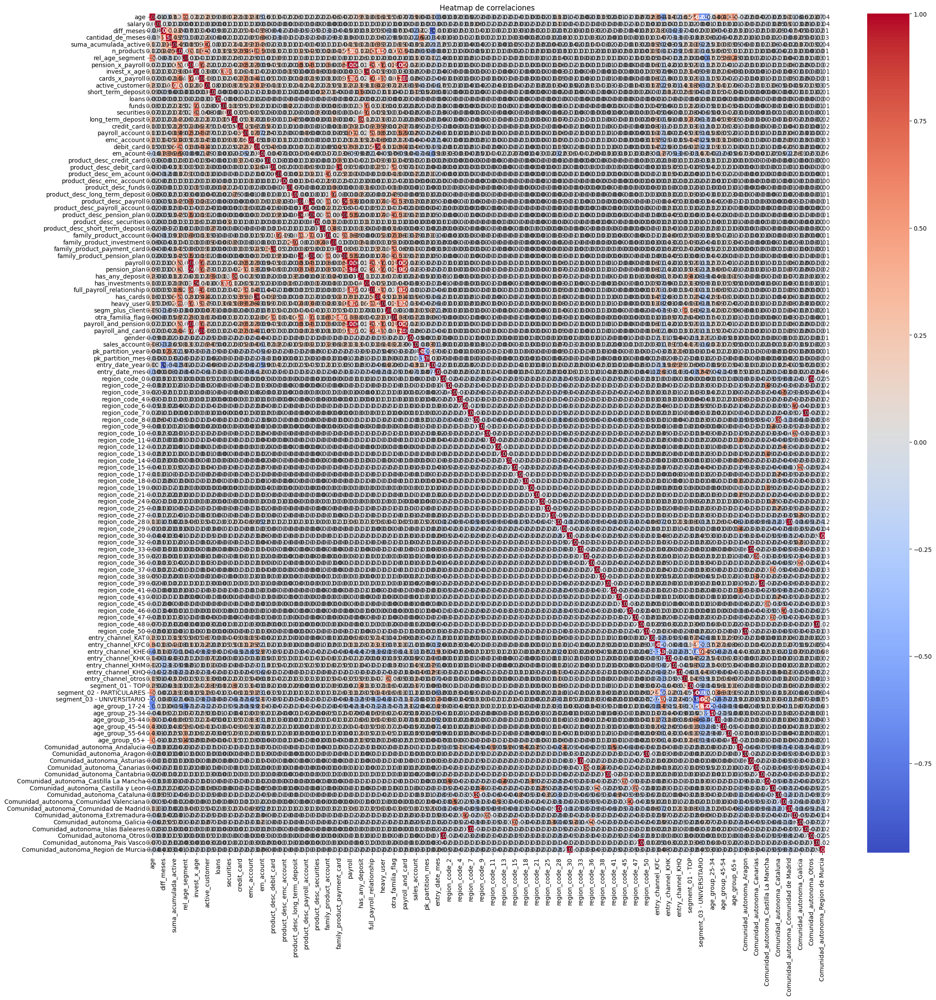

In [57]:
# Columnas numéricas
df_corr = df_eda_ohc.corr()

plt.figure(figsize=(25, 25))
sns.heatmap(df_corr, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Heatmap de correlaciones")
plt.show()


In [58]:
df_eda_ohc.to_csv("data/processed/output_limpio_procesado.csv", sep="|", index=False)


In [59]:
corr = df_eda_ohc.corr()
corr2 = corr.where(np.triu(np.ones(corr.shape),k=1).astype(bool))
corr3 = corr2.unstack().dropna()
corr4 = corr3.sort_values()


In [60]:
corr4.tail(40)


heavy_user                              payroll                          0.7655
Comunidad_autonoma_Extremadura          region_code_6                    0.7690
heavy_user                              pension_plan                     0.7750
family_product_investment               product_desc_long_term_deposit   0.7753
full_payroll_relationship               cards_x_payroll                  0.7795
payroll_and_card                        full_payroll_relationship        0.7795
                                        pension_x_payroll                0.7820
                                        payroll                          0.7820
cards_x_payroll                         pension_x_payroll                0.7820
payroll_and_card                        payroll_and_pension              0.7820
payroll_and_pension                     cards_x_payroll                  0.7820
payroll                                 cards_x_payroll                  0.7820
full_payroll_relationship               

In [61]:
corr4.head(20)


segment_03 - UNIVERSITARIO  segment_02 - PARTICULARES    -0.9594
entry_date_year             diff_meses                   -0.9140
age_group_17-24             age                          -0.6960
segment_02 - PARTICULARES   entry_channel_KHE            -0.6909
segment_03 - UNIVERSITARIO  age                          -0.6785
age_group_17-24             segment_02 - PARTICULARES    -0.5904
pk_partition_mes            pk_partition_year            -0.5748
age_group_25-34             age_group_17-24              -0.5693
segment_03 - UNIVERSITARIO  entry_channel_KFC            -0.5445
entry_channel_KHE           entry_channel_KFC            -0.5280
age_group_17-24             rel_age_segment              -0.4695
entry_channel_KHE           age                          -0.4691
age_group_35-44             segment_03 - UNIVERSITARIO   -0.4674
                            age_group_17-24              -0.4012
entry_date_year             em_acount                    -0.3855
age_group_17-24          